## Imports

In [6]:
import numpy as np
import random
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import math
import time
from tqdm import tqdm
import csv
from Dataloader import DataLoader
from MyAlg import MyAlg
from FCFS import FCFS
from OptimalOffline import OptimalOffline

## Load Dataset and Initialize DataLoader

In [187]:
dataset_path = "dataset/evchargingdataset.csv"
delta_minutes = 15
instance_length_hours = 24

number_of_stations = 3

dataloader = DataLoader(
    dataset_path,
    delta_minutes=delta_minutes,
    instance_length_hours=instance_length_hours,
    num_stations=number_of_stations,
    value_mode="fixed",
    # value_mode="stationwise",
    fav_alpha=0.7,
    ev_multiplier=5,
    seed=42,
    U=20,
)
time_window = dataloader.time_window

base_cap = 3 / number_of_stations
capacities = [base_cap for _ in range(number_of_stations)]
value_mode = dataloader.value_mode

[EVDataLoader] Data loading completed.
  • Number of instances      : 88
  • Total EVs loaded         : 41765
  • Instance length (hours)  : 24.0
  • Time discretization (min): 15.0
  • Time window (# of slots) : 97
  • D_min                    : 2
  • D_max                    : 16



In [162]:
dataloader.value_mode

'stationwise'

In [163]:
value_mode

'stationwise'

## Calculate D

In [51]:
def compute_max_demand_over_rate_limit(dataloader):
    ratios = []
    max_ratio = -float("inf")
    max_ev_info = None

    for instance_id, instance in enumerate(dataloader.instances):
        for ev in instance:
            demand = float(ev.get("demand", 0))
            rate_limit = float(ev.get("rateLimit", 0))

            if rate_limit <= 0:
                continue

            ratio = demand / rate_limit
            ratios.append(ratio)

            if ratio > max_ratio:
                max_ratio = ratio
                max_ev_info = {
                    "instance_id": instance_id,
                    "ev_id": ev.get("id"),
                    "arrival": ev.get("arrival"),
                    "departure": ev.get("departure"),
                    "demand": demand,
                    "rateLimit": rate_limit,
                    "demand_over_rateLimit": ratio,
                }

    if not ratios:
        return None, None

    return max_ratio, max_ev_info


max_ratio, max_ev_info = compute_max_demand_over_rate_limit(dataloader)

print("Maximum demand / rateLimit over all requests =", max_ratio)
print("Request achieving the maximum:")
print(max_ev_info)

Maximum demand / rateLimit over all requests = 16.0
Request achieving the maximum:
{'instance_id': 0, 'ev_id': 'EV10000', 'arrival': 0, 'departure': 15, 'demand': 6.105723163226746, 'rateLimit': 0.38160769770167163, 'demand_over_rateLimit': 16.0}


In [52]:
D_from_data = int(np.ceil(max_ratio))
theta = float(dataloader.theta)

print("theta =", theta)
print("max(demand / rateLimit) =", max_ratio)
print("Using D =", D_from_data)


def theory_log_beta_lower_bound(theta, D, eta):
    theta = float(theta)
    eta = float(eta)
    D = int(D)

    if eta <= 0:
        return np.inf

    log_beta_lb = 0.0
    for i in range(1, D + 1):
        term = 1.0 - theta / (i * (theta + eta))

        if term <= 0:
            return np.inf

        log_beta_lb += -math.log(term)

    return log_beta_lb


def theory_beta_from_eta(theta, D, eta):
    log_beta = theory_log_beta_lower_bound(theta, D, eta)
    if not np.isfinite(log_beta):
        return np.inf
    return math.exp(log_beta)


def theory_objective_from_eta(theta, D, eta):
    log_beta = theory_log_beta_lower_bound(theta, D, eta)
    if not np.isfinite(log_beta):
        return np.inf
    return (1.0 + float(eta)) * log_beta


def grid_search_eta_beta(theta, D, eta_min=1e-3, eta_max=1e3, num_grid=2000):
    eta_grid = np.logspace(np.log10(eta_min), np.log10(eta_max), num_grid)

    rows = []
    best_eta = None
    best_beta = None
    best_obj = np.inf

    for eta in eta_grid:
        beta = theory_beta_from_eta(theta, D, eta)
        obj = theory_objective_from_eta(theta, D, eta)

        rows.append(
            {
                "eta": float(eta),
                "beta_min": float(beta),
                "objective": float(obj),
            }
        )

        if np.isfinite(obj) and obj < best_obj:
            best_obj = float(obj)
            best_eta = float(eta)
            best_beta = float(beta)

    results_df = pd.DataFrame(rows)
    return best_eta, best_beta, best_obj, results_df


best_eta, best_beta, best_obj, theory_grid_df = grid_search_eta_beta(
    theta=theta,
    D=D_from_data,
    eta_min=1e-3,
    eta_max=1e3,
    num_grid=2000,
)

print("\n=== Best Parameters Used ===")
print(f"best beta = {best_beta:.10f}")
print(f"best eta  = {best_eta:.10f}")
print(f"best objective = {best_obj:.10f}")

theta = 20.0
max(demand / rateLimit) = 16.0
Using D = 16

=== Best Parameters Used ===
best beta = 2038.8513311018
best eta  = 0.1542034346
best objective = 8.7951939017


## Average Total Demand per Instance

In [53]:
def compute_avg_instance_demand(dataloader):
    instance_demands = []

    for instance in dataloader.instances:
        total_demand = sum(ev["demand"] for ev in instance)
        instance_demands.append(total_demand)

    avg_demand = np.mean(instance_demands) if instance_demands else 0.0

    return avg_demand

In [54]:
avg_demand = compute_avg_instance_demand(dataloader)

## Run MyAlg on theoretical beta and eta

In [55]:
def run_theory_myalg_on_instance(instance, capacities, time_window, beta, eta):
    myalg = MyAlg(capacities, time_window)
    myalg.set_beta(float(beta))
    myalg.set_eta(float(eta))
    myalg.reset()

    total_utility = 0.0
    admitted_evs = 0

    for ev in instance:
        admit, schedule = myalg.decide(ev)

        if not admit:
            continue

        myalg.admit(schedule)
        admitted_evs += 1

        chosen_station = next(iter(schedule))
        total_utility += float(ev["value"][chosen_station])

    return total_utility, admitted_evs

## Save results to CSV

In [56]:
def save_theory_myalg_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    best_beta,
    best_eta,
    best_obj,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    theta = float(dataloader.theta)
    D = int(dataloader.D_max)

    theory_beta = float(best_beta)
    theory_eta = float(best_eta)
    theory_obj = float(best_obj)

    print("\n=== Using Parameters in Simulation ===")
    print(f"beta = {theory_beta}")
    print(f"eta  = {theory_eta}")

    file_path = os.path.join(
        out_dir, f"theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "beta",
                "eta",
                "theory_myalg_utility",
                "theory_myalg_admitted_evs",
                "theta",
                "D",
                "theory_objective",
            ]
        )

        for C_total in total_capacity_list:
            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)
            load_factor = avg_demand / (float(C_total) * float(time_window))

            for instance_id, instance in enumerate(dataloader):
                utility, admitted_evs = run_theory_myalg_on_instance(
                    instance=instance,
                    capacities=capacities,
                    time_window=time_window,
                    beta=theory_beta,
                    eta=theory_eta,
                )

                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(theory_beta),
                        float(theory_eta),
                        float(utility),
                        int(admitted_evs),
                        float(theta),
                        int(D),
                        float(theory_obj),
                    ]
                )

    print("Saved to:", file_path)
    print("theory beta =", theory_beta)
    print("theory eta  =", theory_eta)

    return file_path

## Running the MyAlg with only best theoretical beta and eta

In [57]:
used_beta = best_beta / 6
used_beta

339.80855518362944

In [58]:
avg_demand = compute_avg_instance_demand(dataloader)
target_load_factors = np.arange(4, 19, 2).tolist()

total_capacity_list = [
    avg_demand / (lf * time_window)
    for lf in target_load_factors
]

theory_csv = save_theory_myalg_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    best_beta=used_beta,
    best_eta=best_eta,
    best_obj=best_obj,
    out_dir="results",
)


=== Using Parameters in Simulation ===
beta = 339.80855518362944
eta  = 0.15420343462985658
Saved to: results/theory_myalg_instance_results_stationwise_by_loadfactor.csv
theory beta = 339.80855518362944
theory eta  = 0.15420343462985658


## Algorithm Evaluation


In [59]:
def evaluate(dataloader, algorithm, instance_limit=None):
    values = []
    evaluated = 0

    for instance_idx, instance in enumerate(
        tqdm(dataloader, desc="Processing instances", unit="instance")
    ):
        algorithm.reset()
        instance_values = []

        for ev in tqdm(
            instance,
            desc=f"Processing EVs (instance {instance_idx})",
            unit="EV",
            leave=False,
        ):
            admit, schedule = algorithm.decide(ev)

            if not admit:
                continue

            algorithm.admit(schedule)

            # schedule looks like {station_id: {t: y_t, ...}}
            chosen_station = list(schedule.keys())[0] if schedule else None

            values_per_station = ev.get("value", [])
            demand = ev.get("demand", 0)

            # realized value = value for the chosen station
            realized_value = (
                values_per_station[chosen_station]
                if (
                    chosen_station is not None
                    and isinstance(values_per_station, list)
                    and len(values_per_station) > chosen_station
                )
                else 0
            )

            density = realized_value / demand if demand > 0 else 0

            ev_info = {
                "id": ev.get("id"),
                "chosen_station": chosen_station,
                "values_per_station": values_per_station,
                "realized_value": realized_value,
                "demand": demand,
                "density": density,
                "favorite_station": ev.get("favorite_station"),
            }

            instance_values.append(ev_info)

        values.append(instance_values)
        evaluated += 1

        if instance_limit is not None and evaluated >= instance_limit:
            break

    return values

In [60]:
## Evaluating the FCFS Baseline


In [61]:
def save_fcfs_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    file_path = os.path.join(
        out_dir, f"fcfs_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "fcfs_utility",
                "fcfs_admitted_evs",
            ]
        )

        for C_total in total_capacity_list:

            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)

            fcfs = FCFS(capacities, time_window)
            load_factor = avg_demand / (float(C_total) * float(time_window))
            
            for instance_id, instance in enumerate(dataloader):
    
                fcfs.reset()
                total_utility = 0.0
                admitted_evs = 0

                for ev in instance:
                    
                    admit, schedule = fcfs.decide(ev)

                    if not admit or not schedule:
                        continue

                    fcfs.admit(schedule)
                    admitted_evs += 1

                    chosen_station = list(schedule.keys())[0]
                    values_per_station = ev.get("value", [])

                    realized_value = (
                        values_per_station[chosen_station]
                        if (
                            isinstance(values_per_station, list)
                            and 0 <= chosen_station < len(values_per_station)
                        )
                        else 0.0
                    )

                    total_utility += float(realized_value)
                    print(f"{admitted_evs}) Admission: {admit} - Ev values: {ev['value']} - all densities: {np.array(ev['value']) / ev['demand']} - added value: {ev['value'][chosen_station]} - station: {chosen_station} - density: {ev['value'][chosen_station] / ev['demand']} - energy: {ev['demand']}")
                print(f"Total Evs: {len(instance)}")
                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(total_utility),
                        int(admitted_evs),
                    ]
                )

    print("Saved to:", file_path)

In [62]:
avg_demand = compute_avg_instance_demand(dataloader)

target_load_factors = np.arange(4, 19, 2).tolist()

total_capacity_list = [
    avg_demand / (lf * time_window)
    for lf in target_load_factors
]

save_fcfs_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)

1) Admission: True - Ev values: [8.688798553633434, 23.310991002953475, 89.01641695939136] - all densities: [ 1.42305806  3.8178919  14.57917671] - added value: 8.688798553633434 - station: 0 - density: 1.4230580590295856 - energy: 6.105723163226746
2) Admission: True - Ev values: [15.254353842872085, 124.27912862138115, 33.833110881414754] - all densities: [ 1.83767436 14.97176288  4.07583574] - added value: 15.254353842872085 - station: 0 - density: 1.8376743637546475 - energy: 8.300901478380057
3) Admission: True - Ev values: [24.72128579220508, 13.273863023308376, 138.21281599430668] - all densities: [ 2.74581454  1.47433942 15.35141672] - added value: 13.273863023308376 - station: 1 - density: 1.4743394188421957 - energy: 9.003261293612017
4) Admission: True - Ev values: [11.635230439513979, 85.01465903820197, 13.502834801485308] - all densities: [ 2.05629969 15.02468027  2.38636228] - added value: 11.635230439513979 - station: 0 - density: 2.0562996918183503 - energy: 5.658333989

## Evaluating the MyAlg Algorithm

In [63]:
def run_myalg_on_instance(instance, capacities, time_window, beta, eta):
    myalg = MyAlg(capacities, time_window)
    myalg.set_beta(float(beta))
    myalg.set_eta(float(eta))
    myalg.reset()

    total_utility = 0.0
    admitted_evs = 0

    for ev in instance:
        admit, schedule = myalg.decide(ev)

        if not admit:
            continue

        myalg.admit(schedule)
        admitted_evs += 1

        chosen_station = next(iter(schedule))
        total_utility += float(ev["value"][chosen_station])

    return total_utility, admitted_evs

In [64]:
from itertools import product
import time


def save_myalg_beta_eta_grid_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    beta_list,
    eta_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode

    file_path = os.path.join(
        out_dir, f"myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
    )

    rows = []

    pairs = list(product(beta_list, eta_list))
    num_pairs = len(pairs)

    for C_total in total_capacity_list:
        base_cap = float(C_total) / float(number_of_stations)
        capacities = [base_cap] * int(number_of_stations)
        load_factor = avg_demand / (float(C_total) * float(time_window))

        print(f"\n=== Capacity {C_total:.2f} | Load factor {load_factor:.4f} ===")

        for instance_id, instance in enumerate(dataloader):
            start_time = time.time()

            for beta, eta in tqdm(
                pairs,
                desc=f"Cap {C_total:.2f} | Inst {instance_id}",
                leave=False,
            ):
                utility, admitted_evs = run_myalg_on_instance(
                    instance=instance,
                    capacities=capacities,
                    time_window=time_window,
                    beta=float(beta),
                    eta=float(eta),
                )

                rows.append(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(beta),
                        float(eta),
                        float(utility),
                        int(admitted_evs),
                    ]
                )

            elapsed = time.time() - start_time
            print(
                f"Instance {instance_id} finished in {elapsed:.2f} seconds "
                f"({elapsed / num_pairs:.6f} sec per (beta, eta) pair)"
            )

    df = pd.DataFrame(
        rows,
        columns=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
            "myalg_admitted_evs",
        ],
    )

    df.to_csv(file_path, index=False)

    print("\nSaved to:", file_path)
    return file_path

In [8]:
def safe_ratio(offline_u, myalg_u, eps=1e-12):
    if pd.isna(offline_u) or pd.isna(myalg_u):
        return np.nan
    return float(offline_u) / max(float(myalg_u), eps)

In [66]:
avg_demand = compute_avg_instance_demand(dataloader)

target_load_factors = np.arange(4, 19, 2).tolist()

total_capacity_list = [
    avg_demand / (lf * time_window)
    for lf in target_load_factors
]
beta_list = np.arange(2, 10, 0.2).tolist()
eta_list = np.arange(0.1, 3, 0.2).tolist()

value_mode = dataloader.value_mode

myalg_grid_csv = save_myalg_beta_eta_grid_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    beta_list=beta_list,
    eta_list=eta_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)


=== Capacity 9.56 | Load factor 4.0000 ===


Instance 0 finished in 10.38 seconds (0.017303 sec per (beta, eta) pair)


Instance 1 finished in 9.53 seconds (0.015889 sec per (beta, eta) pair)


Instance 2 finished in 9.72 seconds (0.016199 sec per (beta, eta) pair)


Instance 3 finished in 9.88 seconds (0.016471 sec per (beta, eta) pair)


Instance 4 finished in 9.82 seconds (0.016366 sec per (beta, eta) pair)


Instance 5 finished in 10.29 seconds (0.017148 sec per (beta, eta) pair)


Instance 6 finished in 10.34 seconds (0.017225 sec per (beta, eta) pair)


Instance 7 finished in 9.64 seconds (0.016067 sec per (beta, eta) pair)


Instance 8 finished in 9.66 seconds (0.016097 sec per (beta, eta) pair)


Instance 9 finished in 9.49 seconds (0.015810 sec per (beta, eta) pair)


Instance 10 finished in 9.30 seconds (0.015503 sec per (beta, eta) pair)


Instance 11 finished in 9.44 seconds (0.015728 sec per (beta, eta) pair)


Instance 12 finished in 9.86 seconds (0.016435 sec per (beta, eta) pair)


Instance 13 finished in 9.28 seconds (0.015459 sec per (beta, eta) pair)


Instance 14 finished in 9.86 seconds (0.016427 sec per (beta, eta) pair)


Instance 15 finished in 10.49 seconds (0.017478 sec per (beta, eta) pair)


Instance 16 finished in 9.79 seconds (0.016316 sec per (beta, eta) pair)


Instance 17 finished in 9.37 seconds (0.015609 sec per (beta, eta) pair)


Instance 18 finished in 9.26 seconds (0.015425 sec per (beta, eta) pair)


Instance 19 finished in 9.67 seconds (0.016114 sec per (beta, eta) pair)


Instance 20 finished in 9.68 seconds (0.016132 sec per (beta, eta) pair)


Instance 21 finished in 9.83 seconds (0.016383 sec per (beta, eta) pair)


Instance 22 finished in 9.85 seconds (0.016409 sec per (beta, eta) pair)


Instance 23 finished in 9.67 seconds (0.016119 sec per (beta, eta) pair)


Instance 24 finished in 9.25 seconds (0.015419 sec per (beta, eta) pair)


Instance 25 finished in 9.34 seconds (0.015561 sec per (beta, eta) pair)


Instance 26 finished in 8.84 seconds (0.014729 sec per (beta, eta) pair)


Instance 27 finished in 9.16 seconds (0.015266 sec per (beta, eta) pair)


Instance 28 finished in 9.60 seconds (0.016004 sec per (beta, eta) pair)


Instance 29 finished in 9.27 seconds (0.015445 sec per (beta, eta) pair)


Instance 30 finished in 13.12 seconds (0.021867 sec per (beta, eta) pair)


Instance 31 finished in 9.78 seconds (0.016297 sec per (beta, eta) pair)


Instance 32 finished in 9.76 seconds (0.016270 sec per (beta, eta) pair)


Instance 33 finished in 9.00 seconds (0.014993 sec per (beta, eta) pair)


Instance 34 finished in 9.19 seconds (0.015324 sec per (beta, eta) pair)


Instance 35 finished in 9.56 seconds (0.015931 sec per (beta, eta) pair)


Instance 36 finished in 9.61 seconds (0.016015 sec per (beta, eta) pair)


Instance 37 finished in 9.38 seconds (0.015632 sec per (beta, eta) pair)


Instance 38 finished in 9.47 seconds (0.015775 sec per (beta, eta) pair)


Instance 39 finished in 9.38 seconds (0.015629 sec per (beta, eta) pair)


Instance 40 finished in 10.10 seconds (0.016828 sec per (beta, eta) pair)


Instance 41 finished in 9.97 seconds (0.016616 sec per (beta, eta) pair)


Instance 42 finished in 9.38 seconds (0.015625 sec per (beta, eta) pair)


Instance 43 finished in 9.26 seconds (0.015430 sec per (beta, eta) pair)


Instance 44 finished in 9.53 seconds (0.015877 sec per (beta, eta) pair)


Instance 45 finished in 9.18 seconds (0.015296 sec per (beta, eta) pair)


Instance 46 finished in 9.73 seconds (0.016225 sec per (beta, eta) pair)


Instance 47 finished in 10.10 seconds (0.016832 sec per (beta, eta) pair)


Instance 48 finished in 9.35 seconds (0.015576 sec per (beta, eta) pair)


Instance 49 finished in 9.66 seconds (0.016094 sec per (beta, eta) pair)


Instance 50 finished in 9.54 seconds (0.015905 sec per (beta, eta) pair)


Instance 51 finished in 9.10 seconds (0.015168 sec per (beta, eta) pair)


Instance 52 finished in 9.59 seconds (0.015991 sec per (beta, eta) pair)


Instance 53 finished in 9.58 seconds (0.015963 sec per (beta, eta) pair)


Instance 54 finished in 9.77 seconds (0.016286 sec per (beta, eta) pair)


Instance 55 finished in 9.71 seconds (0.016189 sec per (beta, eta) pair)


Instance 56 finished in 9.81 seconds (0.016346 sec per (beta, eta) pair)


Instance 57 finished in 9.14 seconds (0.015240 sec per (beta, eta) pair)


Instance 58 finished in 9.30 seconds (0.015503 sec per (beta, eta) pair)


Instance 59 finished in 9.41 seconds (0.015683 sec per (beta, eta) pair)


Instance 60 finished in 9.68 seconds (0.016138 sec per (beta, eta) pair)


Instance 61 finished in 9.80 seconds (0.016330 sec per (beta, eta) pair)


Instance 62 finished in 9.55 seconds (0.015912 sec per (beta, eta) pair)


Instance 63 finished in 10.16 seconds (0.016939 sec per (beta, eta) pair)


Instance 64 finished in 9.68 seconds (0.016136 sec per (beta, eta) pair)


Instance 65 finished in 13.26 seconds (0.022101 sec per (beta, eta) pair)


Instance 66 finished in 9.59 seconds (0.015991 sec per (beta, eta) pair)


Instance 67 finished in 10.12 seconds (0.016859 sec per (beta, eta) pair)


Instance 68 finished in 9.45 seconds (0.015758 sec per (beta, eta) pair)


Instance 69 finished in 9.27 seconds (0.015451 sec per (beta, eta) pair)


Instance 70 finished in 9.59 seconds (0.015976 sec per (beta, eta) pair)


Instance 71 finished in 9.59 seconds (0.015977 sec per (beta, eta) pair)


Instance 72 finished in 9.46 seconds (0.015764 sec per (beta, eta) pair)


Instance 73 finished in 9.35 seconds (0.015588 sec per (beta, eta) pair)


Instance 74 finished in 9.63 seconds (0.016046 sec per (beta, eta) pair)


Instance 75 finished in 9.59 seconds (0.015981 sec per (beta, eta) pair)


Instance 76 finished in 9.54 seconds (0.015892 sec per (beta, eta) pair)


Instance 77 finished in 10.04 seconds (0.016741 sec per (beta, eta) pair)


Instance 78 finished in 9.41 seconds (0.015683 sec per (beta, eta) pair)


Instance 79 finished in 9.55 seconds (0.015911 sec per (beta, eta) pair)


Instance 80 finished in 10.25 seconds (0.017087 sec per (beta, eta) pair)


Instance 81 finished in 9.97 seconds (0.016624 sec per (beta, eta) pair)


Instance 82 finished in 9.58 seconds (0.015973 sec per (beta, eta) pair)


Instance 83 finished in 10.02 seconds (0.016706 sec per (beta, eta) pair)


Instance 84 finished in 9.96 seconds (0.016599 sec per (beta, eta) pair)


Instance 85 finished in 10.34 seconds (0.017226 sec per (beta, eta) pair)


Instance 86 finished in 9.43 seconds (0.015721 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 6.37 | Load factor 6.0000 ===


Instance 0 finished in 7.98 seconds (0.013296 sec per (beta, eta) pair)


Instance 1 finished in 8.02 seconds (0.013364 sec per (beta, eta) pair)


Instance 2 finished in 8.15 seconds (0.013582 sec per (beta, eta) pair)


Instance 3 finished in 8.34 seconds (0.013893 sec per (beta, eta) pair)


Instance 4 finished in 8.32 seconds (0.013862 sec per (beta, eta) pair)


Instance 5 finished in 8.32 seconds (0.013871 sec per (beta, eta) pair)


Instance 6 finished in 8.71 seconds (0.014524 sec per (beta, eta) pair)


Instance 7 finished in 8.12 seconds (0.013537 sec per (beta, eta) pair)


Instance 8 finished in 8.28 seconds (0.013804 sec per (beta, eta) pair)


Instance 9 finished in 8.37 seconds (0.013952 sec per (beta, eta) pair)


Instance 10 finished in 7.94 seconds (0.013226 sec per (beta, eta) pair)


Instance 11 finished in 8.45 seconds (0.014079 sec per (beta, eta) pair)


Instance 12 finished in 12.49 seconds (0.020816 sec per (beta, eta) pair)


Instance 13 finished in 8.08 seconds (0.013474 sec per (beta, eta) pair)


Instance 14 finished in 7.97 seconds (0.013277 sec per (beta, eta) pair)


Instance 15 finished in 8.63 seconds (0.014376 sec per (beta, eta) pair)


Instance 16 finished in 8.41 seconds (0.014018 sec per (beta, eta) pair)


Instance 17 finished in 7.75 seconds (0.012908 sec per (beta, eta) pair)


Instance 18 finished in 8.11 seconds (0.013510 sec per (beta, eta) pair)


Instance 19 finished in 8.16 seconds (0.013605 sec per (beta, eta) pair)


Instance 20 finished in 8.46 seconds (0.014096 sec per (beta, eta) pair)


Instance 21 finished in 7.95 seconds (0.013245 sec per (beta, eta) pair)


Instance 22 finished in 8.36 seconds (0.013941 sec per (beta, eta) pair)


Instance 23 finished in 7.99 seconds (0.013310 sec per (beta, eta) pair)


Instance 24 finished in 7.94 seconds (0.013240 sec per (beta, eta) pair)


Instance 25 finished in 7.96 seconds (0.013260 sec per (beta, eta) pair)


Instance 26 finished in 7.74 seconds (0.012898 sec per (beta, eta) pair)


Instance 27 finished in 8.03 seconds (0.013376 sec per (beta, eta) pair)


Instance 28 finished in 8.33 seconds (0.013879 sec per (beta, eta) pair)


Instance 29 finished in 8.12 seconds (0.013533 sec per (beta, eta) pair)


Instance 30 finished in 8.04 seconds (0.013396 sec per (beta, eta) pair)


Instance 31 finished in 8.09 seconds (0.013481 sec per (beta, eta) pair)


Instance 32 finished in 8.32 seconds (0.013860 sec per (beta, eta) pair)


Instance 33 finished in 7.80 seconds (0.013005 sec per (beta, eta) pair)


Instance 34 finished in 7.92 seconds (0.013197 sec per (beta, eta) pair)


Instance 35 finished in 8.43 seconds (0.014048 sec per (beta, eta) pair)


Instance 36 finished in 8.63 seconds (0.014382 sec per (beta, eta) pair)


Instance 37 finished in 8.09 seconds (0.013481 sec per (beta, eta) pair)


Instance 38 finished in 8.13 seconds (0.013548 sec per (beta, eta) pair)


Instance 39 finished in 8.45 seconds (0.014088 sec per (beta, eta) pair)


Instance 40 finished in 8.38 seconds (0.013960 sec per (beta, eta) pair)


Instance 41 finished in 8.02 seconds (0.013365 sec per (beta, eta) pair)


Instance 42 finished in 8.14 seconds (0.013572 sec per (beta, eta) pair)


Instance 43 finished in 7.70 seconds (0.012829 sec per (beta, eta) pair)


Instance 44 finished in 8.17 seconds (0.013623 sec per (beta, eta) pair)


Instance 45 finished in 7.84 seconds (0.013065 sec per (beta, eta) pair)


Instance 46 finished in 8.57 seconds (0.014291 sec per (beta, eta) pair)


Instance 47 finished in 8.60 seconds (0.014328 sec per (beta, eta) pair)


Instance 48 finished in 7.79 seconds (0.012991 sec per (beta, eta) pair)


Instance 49 finished in 9.25 seconds (0.015415 sec per (beta, eta) pair)


Instance 50 finished in 11.50 seconds (0.019169 sec per (beta, eta) pair)


Instance 51 finished in 7.88 seconds (0.013126 sec per (beta, eta) pair)


Instance 52 finished in 8.37 seconds (0.013952 sec per (beta, eta) pair)


Instance 53 finished in 8.43 seconds (0.014058 sec per (beta, eta) pair)


Instance 54 finished in 8.38 seconds (0.013965 sec per (beta, eta) pair)


Instance 55 finished in 7.91 seconds (0.013191 sec per (beta, eta) pair)


Instance 56 finished in 8.43 seconds (0.014048 sec per (beta, eta) pair)


Instance 57 finished in 7.86 seconds (0.013102 sec per (beta, eta) pair)


Instance 58 finished in 8.16 seconds (0.013601 sec per (beta, eta) pair)


Instance 59 finished in 7.96 seconds (0.013273 sec per (beta, eta) pair)


Instance 60 finished in 8.23 seconds (0.013724 sec per (beta, eta) pair)


Instance 61 finished in 8.47 seconds (0.014117 sec per (beta, eta) pair)


Instance 62 finished in 8.11 seconds (0.013518 sec per (beta, eta) pair)


Instance 63 finished in 8.67 seconds (0.014452 sec per (beta, eta) pair)


Instance 64 finished in 8.22 seconds (0.013704 sec per (beta, eta) pair)


Instance 65 finished in 8.05 seconds (0.013412 sec per (beta, eta) pair)


Instance 66 finished in 8.25 seconds (0.013750 sec per (beta, eta) pair)


Instance 67 finished in 8.53 seconds (0.014209 sec per (beta, eta) pair)


Instance 68 finished in 8.24 seconds (0.013742 sec per (beta, eta) pair)


Instance 69 finished in 7.94 seconds (0.013238 sec per (beta, eta) pair)


Instance 70 finished in 8.43 seconds (0.014046 sec per (beta, eta) pair)


Instance 71 finished in 8.51 seconds (0.014190 sec per (beta, eta) pair)


Instance 72 finished in 8.34 seconds (0.013898 sec per (beta, eta) pair)


Instance 73 finished in 8.28 seconds (0.013799 sec per (beta, eta) pair)


Instance 74 finished in 8.25 seconds (0.013742 sec per (beta, eta) pair)


Instance 75 finished in 8.10 seconds (0.013494 sec per (beta, eta) pair)


Instance 76 finished in 8.23 seconds (0.013716 sec per (beta, eta) pair)


Instance 77 finished in 8.43 seconds (0.014054 sec per (beta, eta) pair)


Instance 78 finished in 8.02 seconds (0.013373 sec per (beta, eta) pair)


Instance 79 finished in 8.12 seconds (0.013531 sec per (beta, eta) pair)


Instance 80 finished in 8.53 seconds (0.014218 sec per (beta, eta) pair)


Instance 81 finished in 8.30 seconds (0.013840 sec per (beta, eta) pair)


Instance 82 finished in 8.27 seconds (0.013791 sec per (beta, eta) pair)


Instance 83 finished in 8.11 seconds (0.013517 sec per (beta, eta) pair)


Instance 84 finished in 8.27 seconds (0.013777 sec per (beta, eta) pair)


Instance 85 finished in 8.52 seconds (0.014198 sec per (beta, eta) pair)


Instance 86 finished in 8.02 seconds (0.013373 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 4.78 | Load factor 8.0000 ===


Instance 0 finished in 12.01 seconds (0.020016 sec per (beta, eta) pair)


Instance 1 finished in 7.45 seconds (0.012422 sec per (beta, eta) pair)


Instance 2 finished in 7.44 seconds (0.012408 sec per (beta, eta) pair)


Instance 3 finished in 7.56 seconds (0.012603 sec per (beta, eta) pair)


Instance 4 finished in 7.47 seconds (0.012456 sec per (beta, eta) pair)


Instance 5 finished in 7.60 seconds (0.012667 sec per (beta, eta) pair)


Instance 6 finished in 7.53 seconds (0.012551 sec per (beta, eta) pair)


Instance 7 finished in 7.51 seconds (0.012515 sec per (beta, eta) pair)


Instance 8 finished in 7.60 seconds (0.012674 sec per (beta, eta) pair)


Instance 9 finished in 7.61 seconds (0.012688 sec per (beta, eta) pair)


Instance 10 finished in 7.18 seconds (0.011966 sec per (beta, eta) pair)


Instance 11 finished in 7.64 seconds (0.012741 sec per (beta, eta) pair)


Instance 12 finished in 7.63 seconds (0.012717 sec per (beta, eta) pair)


Instance 13 finished in 7.36 seconds (0.012272 sec per (beta, eta) pair)


Instance 14 finished in 7.52 seconds (0.012539 sec per (beta, eta) pair)


Instance 15 finished in 7.87 seconds (0.013123 sec per (beta, eta) pair)


Instance 16 finished in 7.33 seconds (0.012219 sec per (beta, eta) pair)


Instance 17 finished in 7.28 seconds (0.012137 sec per (beta, eta) pair)


Instance 18 finished in 7.50 seconds (0.012495 sec per (beta, eta) pair)


Instance 19 finished in 7.54 seconds (0.012567 sec per (beta, eta) pair)


Instance 20 finished in 7.60 seconds (0.012672 sec per (beta, eta) pair)


Instance 21 finished in 7.16 seconds (0.011939 sec per (beta, eta) pair)


Instance 22 finished in 7.01 seconds (0.011680 sec per (beta, eta) pair)


Instance 23 finished in 7.37 seconds (0.012279 sec per (beta, eta) pair)


Instance 24 finished in 7.24 seconds (0.012070 sec per (beta, eta) pair)


Instance 25 finished in 7.60 seconds (0.012674 sec per (beta, eta) pair)


Instance 26 finished in 7.20 seconds (0.011994 sec per (beta, eta) pair)


Instance 27 finished in 7.16 seconds (0.011935 sec per (beta, eta) pair)


Instance 28 finished in 7.66 seconds (0.012775 sec per (beta, eta) pair)


Instance 29 finished in 7.55 seconds (0.012587 sec per (beta, eta) pair)


Instance 30 finished in 7.59 seconds (0.012650 sec per (beta, eta) pair)


Instance 31 finished in 7.84 seconds (0.013064 sec per (beta, eta) pair)


Instance 32 finished in 7.52 seconds (0.012532 sec per (beta, eta) pair)


Instance 33 finished in 7.47 seconds (0.012449 sec per (beta, eta) pair)


Instance 34 finished in 7.60 seconds (0.012674 sec per (beta, eta) pair)


Instance 35 finished in 7.51 seconds (0.012522 sec per (beta, eta) pair)


Instance 36 finished in 7.63 seconds (0.012710 sec per (beta, eta) pair)


Instance 37 finished in 7.46 seconds (0.012428 sec per (beta, eta) pair)


Instance 38 finished in 7.56 seconds (0.012605 sec per (beta, eta) pair)


Instance 39 finished in 7.20 seconds (0.012008 sec per (beta, eta) pair)


Instance 40 finished in 7.61 seconds (0.012687 sec per (beta, eta) pair)


Instance 41 finished in 10.77 seconds (0.017953 sec per (beta, eta) pair)


Instance 42 finished in 7.20 seconds (0.011993 sec per (beta, eta) pair)


Instance 43 finished in 7.24 seconds (0.012070 sec per (beta, eta) pair)


Instance 44 finished in 7.41 seconds (0.012353 sec per (beta, eta) pair)


Instance 45 finished in 7.24 seconds (0.012068 sec per (beta, eta) pair)


Instance 46 finished in 7.58 seconds (0.012626 sec per (beta, eta) pair)


Instance 47 finished in 7.79 seconds (0.012985 sec per (beta, eta) pair)


Instance 48 finished in 7.12 seconds (0.011866 sec per (beta, eta) pair)


Instance 49 finished in 7.77 seconds (0.012945 sec per (beta, eta) pair)


Instance 50 finished in 7.85 seconds (0.013078 sec per (beta, eta) pair)


Instance 51 finished in 7.11 seconds (0.011851 sec per (beta, eta) pair)


Instance 52 finished in 7.53 seconds (0.012548 sec per (beta, eta) pair)


Instance 53 finished in 7.60 seconds (0.012671 sec per (beta, eta) pair)


Instance 54 finished in 7.46 seconds (0.012437 sec per (beta, eta) pair)


Instance 55 finished in 7.39 seconds (0.012318 sec per (beta, eta) pair)


Instance 56 finished in 7.70 seconds (0.012836 sec per (beta, eta) pair)


Instance 57 finished in 7.30 seconds (0.012175 sec per (beta, eta) pair)


Instance 58 finished in 7.23 seconds (0.012043 sec per (beta, eta) pair)


Instance 59 finished in 7.12 seconds (0.011871 sec per (beta, eta) pair)


Instance 60 finished in 7.47 seconds (0.012457 sec per (beta, eta) pair)


Instance 61 finished in 7.56 seconds (0.012597 sec per (beta, eta) pair)


Instance 62 finished in 7.28 seconds (0.012136 sec per (beta, eta) pair)


Instance 63 finished in 7.59 seconds (0.012653 sec per (beta, eta) pair)


Instance 64 finished in 7.27 seconds (0.012113 sec per (beta, eta) pair)


Instance 65 finished in 7.33 seconds (0.012218 sec per (beta, eta) pair)


Instance 66 finished in 7.52 seconds (0.012538 sec per (beta, eta) pair)


Instance 67 finished in 7.58 seconds (0.012637 sec per (beta, eta) pair)


Instance 68 finished in 7.31 seconds (0.012187 sec per (beta, eta) pair)


Instance 69 finished in 7.08 seconds (0.011804 sec per (beta, eta) pair)


Instance 70 finished in 7.24 seconds (0.012060 sec per (beta, eta) pair)


Instance 71 finished in 7.31 seconds (0.012183 sec per (beta, eta) pair)


Instance 72 finished in 7.30 seconds (0.012161 sec per (beta, eta) pair)


Instance 73 finished in 7.31 seconds (0.012179 sec per (beta, eta) pair)


Instance 74 finished in 7.38 seconds (0.012306 sec per (beta, eta) pair)


Instance 75 finished in 7.17 seconds (0.011946 sec per (beta, eta) pair)


Instance 76 finished in 7.08 seconds (0.011802 sec per (beta, eta) pair)


Instance 77 finished in 7.66 seconds (0.012770 sec per (beta, eta) pair)


Instance 78 finished in 7.19 seconds (0.011986 sec per (beta, eta) pair)


Instance 79 finished in 7.59 seconds (0.012658 sec per (beta, eta) pair)


Instance 80 finished in 7.56 seconds (0.012595 sec per (beta, eta) pair)


Instance 81 finished in 7.57 seconds (0.012619 sec per (beta, eta) pair)


Instance 82 finished in 7.38 seconds (0.012303 sec per (beta, eta) pair)


Instance 83 finished in 7.38 seconds (0.012297 sec per (beta, eta) pair)


Instance 84 finished in 7.49 seconds (0.012488 sec per (beta, eta) pair)


Instance 85 finished in 12.25 seconds (0.020417 sec per (beta, eta) pair)


Instance 86 finished in 7.08 seconds (0.011806 sec per (beta, eta) pair)


Instance 87 finished in 0.00 seconds (0.000008 sec per (beta, eta) pair)

=== Capacity 3.82 | Load factor 10.0000 ===


Instance 0 finished in 6.91 seconds (0.011515 sec per (beta, eta) pair)


Instance 1 finished in 6.96 seconds (0.011595 sec per (beta, eta) pair)


Instance 2 finished in 7.07 seconds (0.011779 sec per (beta, eta) pair)


Instance 3 finished in 7.01 seconds (0.011689 sec per (beta, eta) pair)


Instance 4 finished in 6.84 seconds (0.011403 sec per (beta, eta) pair)


Instance 5 finished in 7.15 seconds (0.011920 sec per (beta, eta) pair)


Instance 6 finished in 7.08 seconds (0.011793 sec per (beta, eta) pair)


Instance 7 finished in 6.83 seconds (0.011385 sec per (beta, eta) pair)


Instance 8 finished in 6.91 seconds (0.011516 sec per (beta, eta) pair)


Instance 9 finished in 6.90 seconds (0.011508 sec per (beta, eta) pair)


Instance 10 finished in 6.74 seconds (0.011226 sec per (beta, eta) pair)


Instance 11 finished in 6.90 seconds (0.011493 sec per (beta, eta) pair)


Instance 12 finished in 7.10 seconds (0.011831 sec per (beta, eta) pair)


Instance 13 finished in 6.74 seconds (0.011238 sec per (beta, eta) pair)


Instance 14 finished in 6.78 seconds (0.011305 sec per (beta, eta) pair)


Instance 15 finished in 7.05 seconds (0.011755 sec per (beta, eta) pair)


Instance 16 finished in 7.05 seconds (0.011755 sec per (beta, eta) pair)


Instance 17 finished in 7.01 seconds (0.011684 sec per (beta, eta) pair)


Instance 18 finished in 6.95 seconds (0.011584 sec per (beta, eta) pair)


Instance 19 finished in 6.97 seconds (0.011619 sec per (beta, eta) pair)


Instance 20 finished in 7.51 seconds (0.012517 sec per (beta, eta) pair)


Instance 21 finished in 7.22 seconds (0.012029 sec per (beta, eta) pair)


Instance 22 finished in 6.92 seconds (0.011539 sec per (beta, eta) pair)


Instance 23 finished in 7.34 seconds (0.012235 sec per (beta, eta) pair)


Instance 24 finished in 7.10 seconds (0.011837 sec per (beta, eta) pair)


Instance 25 finished in 7.06 seconds (0.011759 sec per (beta, eta) pair)


Instance 26 finished in 6.97 seconds (0.011624 sec per (beta, eta) pair)


Instance 27 finished in 6.82 seconds (0.011366 sec per (beta, eta) pair)


Instance 28 finished in 7.06 seconds (0.011768 sec per (beta, eta) pair)


Instance 29 finished in 7.14 seconds (0.011896 sec per (beta, eta) pair)


Instance 30 finished in 7.10 seconds (0.011839 sec per (beta, eta) pair)


Instance 31 finished in 6.89 seconds (0.011477 sec per (beta, eta) pair)


Instance 32 finished in 7.01 seconds (0.011679 sec per (beta, eta) pair)


Instance 33 finished in 6.49 seconds (0.010811 sec per (beta, eta) pair)


Instance 34 finished in 6.92 seconds (0.011526 sec per (beta, eta) pair)


Instance 35 finished in 7.04 seconds (0.011732 sec per (beta, eta) pair)


Instance 36 finished in 7.19 seconds (0.011975 sec per (beta, eta) pair)


Instance 37 finished in 7.00 seconds (0.011664 sec per (beta, eta) pair)


Instance 38 finished in 7.10 seconds (0.011826 sec per (beta, eta) pair)


Instance 39 finished in 6.83 seconds (0.011385 sec per (beta, eta) pair)


Instance 40 finished in 8.06 seconds (0.013441 sec per (beta, eta) pair)


Instance 41 finished in 10.25 seconds (0.017081 sec per (beta, eta) pair)


Instance 42 finished in 7.05 seconds (0.011747 sec per (beta, eta) pair)


Instance 43 finished in 6.98 seconds (0.011629 sec per (beta, eta) pair)


Instance 44 finished in 7.00 seconds (0.011665 sec per (beta, eta) pair)


Instance 45 finished in 6.68 seconds (0.011131 sec per (beta, eta) pair)


Instance 46 finished in 7.05 seconds (0.011757 sec per (beta, eta) pair)


Instance 47 finished in 7.01 seconds (0.011678 sec per (beta, eta) pair)


Instance 48 finished in 6.61 seconds (0.011023 sec per (beta, eta) pair)


Instance 49 finished in 7.00 seconds (0.011672 sec per (beta, eta) pair)


Instance 50 finished in 7.08 seconds (0.011793 sec per (beta, eta) pair)


Instance 51 finished in 6.63 seconds (0.011056 sec per (beta, eta) pair)


Instance 52 finished in 7.11 seconds (0.011844 sec per (beta, eta) pair)


Instance 53 finished in 6.72 seconds (0.011200 sec per (beta, eta) pair)


Instance 54 finished in 7.11 seconds (0.011854 sec per (beta, eta) pair)


Instance 55 finished in 6.74 seconds (0.011229 sec per (beta, eta) pair)


Instance 56 finished in 7.17 seconds (0.011948 sec per (beta, eta) pair)


Instance 57 finished in 6.98 seconds (0.011638 sec per (beta, eta) pair)


Instance 58 finished in 6.82 seconds (0.011375 sec per (beta, eta) pair)


Instance 59 finished in 6.92 seconds (0.011536 sec per (beta, eta) pair)


Instance 60 finished in 6.97 seconds (0.011613 sec per (beta, eta) pair)


Instance 61 finished in 7.13 seconds (0.011891 sec per (beta, eta) pair)


Instance 62 finished in 6.97 seconds (0.011612 sec per (beta, eta) pair)


Instance 63 finished in 7.08 seconds (0.011796 sec per (beta, eta) pair)


Instance 64 finished in 6.91 seconds (0.011512 sec per (beta, eta) pair)


Instance 65 finished in 6.97 seconds (0.011622 sec per (beta, eta) pair)


Instance 66 finished in 7.13 seconds (0.011890 sec per (beta, eta) pair)


Instance 67 finished in 7.00 seconds (0.011664 sec per (beta, eta) pair)


Instance 68 finished in 7.12 seconds (0.011866 sec per (beta, eta) pair)


Instance 69 finished in 6.80 seconds (0.011332 sec per (beta, eta) pair)


Instance 70 finished in 7.08 seconds (0.011802 sec per (beta, eta) pair)


Instance 71 finished in 7.04 seconds (0.011737 sec per (beta, eta) pair)


Instance 72 finished in 6.81 seconds (0.011351 sec per (beta, eta) pair)


Instance 73 finished in 6.77 seconds (0.011291 sec per (beta, eta) pair)


Instance 74 finished in 6.94 seconds (0.011573 sec per (beta, eta) pair)


Instance 75 finished in 6.95 seconds (0.011587 sec per (beta, eta) pair)


Instance 76 finished in 7.12 seconds (0.011866 sec per (beta, eta) pair)


Instance 77 finished in 7.17 seconds (0.011954 sec per (beta, eta) pair)


Instance 78 finished in 6.79 seconds (0.011325 sec per (beta, eta) pair)


Instance 79 finished in 6.98 seconds (0.011637 sec per (beta, eta) pair)


Instance 80 finished in 7.38 seconds (0.012307 sec per (beta, eta) pair)


Instance 81 finished in 6.95 seconds (0.011588 sec per (beta, eta) pair)


Instance 82 finished in 6.87 seconds (0.011444 sec per (beta, eta) pair)


Instance 83 finished in 6.95 seconds (0.011576 sec per (beta, eta) pair)


Instance 84 finished in 7.07 seconds (0.011777 sec per (beta, eta) pair)


Instance 85 finished in 9.10 seconds (0.015166 sec per (beta, eta) pair)


Instance 86 finished in 9.41 seconds (0.015676 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 3.19 | Load factor 12.0000 ===


Instance 0 finished in 6.89 seconds (0.011491 sec per (beta, eta) pair)


Instance 1 finished in 6.70 seconds (0.011173 sec per (beta, eta) pair)


Instance 2 finished in 6.60 seconds (0.010998 sec per (beta, eta) pair)


Instance 3 finished in 6.75 seconds (0.011253 sec per (beta, eta) pair)


Instance 4 finished in 6.66 seconds (0.011092 sec per (beta, eta) pair)


Instance 5 finished in 6.84 seconds (0.011399 sec per (beta, eta) pair)


Instance 6 finished in 7.10 seconds (0.011834 sec per (beta, eta) pair)


Instance 7 finished in 6.55 seconds (0.010910 sec per (beta, eta) pair)


Instance 8 finished in 6.84 seconds (0.011399 sec per (beta, eta) pair)


Instance 9 finished in 6.81 seconds (0.011352 sec per (beta, eta) pair)


Instance 10 finished in 6.68 seconds (0.011139 sec per (beta, eta) pair)


Instance 11 finished in 6.79 seconds (0.011319 sec per (beta, eta) pair)


Instance 12 finished in 6.83 seconds (0.011381 sec per (beta, eta) pair)


Instance 13 finished in 6.49 seconds (0.010817 sec per (beta, eta) pair)


Instance 14 finished in 6.70 seconds (0.011173 sec per (beta, eta) pair)


Instance 15 finished in 6.88 seconds (0.011471 sec per (beta, eta) pair)


Instance 16 finished in 6.63 seconds (0.011047 sec per (beta, eta) pair)


Instance 17 finished in 6.86 seconds (0.011425 sec per (beta, eta) pair)


Instance 18 finished in 6.89 seconds (0.011479 sec per (beta, eta) pair)


Instance 19 finished in 6.78 seconds (0.011298 sec per (beta, eta) pair)


Instance 20 finished in 6.81 seconds (0.011347 sec per (beta, eta) pair)


Instance 21 finished in 6.56 seconds (0.010939 sec per (beta, eta) pair)


Instance 22 finished in 6.47 seconds (0.010785 sec per (beta, eta) pair)


Instance 23 finished in 6.73 seconds (0.011210 sec per (beta, eta) pair)


Instance 24 finished in 6.68 seconds (0.011137 sec per (beta, eta) pair)


Instance 25 finished in 6.56 seconds (0.010934 sec per (beta, eta) pair)


Instance 26 finished in 6.51 seconds (0.010845 sec per (beta, eta) pair)


Instance 27 finished in 6.72 seconds (0.011198 sec per (beta, eta) pair)


Instance 28 finished in 6.85 seconds (0.011408 sec per (beta, eta) pair)


Instance 29 finished in 6.70 seconds (0.011164 sec per (beta, eta) pair)


Instance 30 finished in 6.50 seconds (0.010828 sec per (beta, eta) pair)


Instance 31 finished in 6.89 seconds (0.011477 sec per (beta, eta) pair)


Instance 32 finished in 6.70 seconds (0.011165 sec per (beta, eta) pair)


Instance 33 finished in 6.58 seconds (0.010966 sec per (beta, eta) pair)


Instance 34 finished in 6.77 seconds (0.011279 sec per (beta, eta) pair)


Instance 35 finished in 6.85 seconds (0.011411 sec per (beta, eta) pair)


Instance 36 finished in 6.80 seconds (0.011334 sec per (beta, eta) pair)


Instance 37 finished in 6.80 seconds (0.011329 sec per (beta, eta) pair)


Instance 38 finished in 6.61 seconds (0.011019 sec per (beta, eta) pair)


Instance 39 finished in 6.52 seconds (0.010871 sec per (beta, eta) pair)


Instance 40 finished in 6.82 seconds (0.011373 sec per (beta, eta) pair)


Instance 41 finished in 6.69 seconds (0.011149 sec per (beta, eta) pair)


Instance 42 finished in 6.71 seconds (0.011184 sec per (beta, eta) pair)


Instance 43 finished in 6.71 seconds (0.011177 sec per (beta, eta) pair)


Instance 44 finished in 11.25 seconds (0.018750 sec per (beta, eta) pair)


Instance 45 finished in 6.30 seconds (0.010504 sec per (beta, eta) pair)


Instance 46 finished in 6.76 seconds (0.011261 sec per (beta, eta) pair)


Instance 47 finished in 6.90 seconds (0.011504 sec per (beta, eta) pair)


Instance 48 finished in 6.46 seconds (0.010766 sec per (beta, eta) pair)


Instance 49 finished in 6.79 seconds (0.011319 sec per (beta, eta) pair)


Instance 50 finished in 6.49 seconds (0.010813 sec per (beta, eta) pair)


Instance 51 finished in 6.56 seconds (0.010938 sec per (beta, eta) pair)


Instance 52 finished in 6.90 seconds (0.011501 sec per (beta, eta) pair)


Instance 53 finished in 6.67 seconds (0.011111 sec per (beta, eta) pair)


Instance 54 finished in 6.55 seconds (0.010918 sec per (beta, eta) pair)


Instance 55 finished in 6.69 seconds (0.011151 sec per (beta, eta) pair)


Instance 56 finished in 6.60 seconds (0.011006 sec per (beta, eta) pair)


Instance 57 finished in 6.57 seconds (0.010956 sec per (beta, eta) pair)


Instance 58 finished in 6.36 seconds (0.010595 sec per (beta, eta) pair)


Instance 59 finished in 6.61 seconds (0.011023 sec per (beta, eta) pair)


Instance 60 finished in 6.69 seconds (0.011143 sec per (beta, eta) pair)


Instance 61 finished in 7.03 seconds (0.011720 sec per (beta, eta) pair)


Instance 62 finished in 7.04 seconds (0.011736 sec per (beta, eta) pair)


Instance 63 finished in 7.12 seconds (0.011869 sec per (beta, eta) pair)


Instance 64 finished in 6.70 seconds (0.011170 sec per (beta, eta) pair)


Instance 65 finished in 6.94 seconds (0.011562 sec per (beta, eta) pair)


Instance 66 finished in 6.82 seconds (0.011370 sec per (beta, eta) pair)


Instance 67 finished in 6.73 seconds (0.011221 sec per (beta, eta) pair)


Instance 68 finished in 7.44 seconds (0.012407 sec per (beta, eta) pair)


Instance 69 finished in 6.82 seconds (0.011359 sec per (beta, eta) pair)


Instance 70 finished in 6.81 seconds (0.011343 sec per (beta, eta) pair)


Instance 71 finished in 7.05 seconds (0.011752 sec per (beta, eta) pair)


Instance 72 finished in 6.88 seconds (0.011467 sec per (beta, eta) pair)


Instance 73 finished in 6.57 seconds (0.010957 sec per (beta, eta) pair)


Instance 74 finished in 6.61 seconds (0.011017 sec per (beta, eta) pair)


Instance 75 finished in 6.61 seconds (0.011020 sec per (beta, eta) pair)


Instance 76 finished in 6.66 seconds (0.011102 sec per (beta, eta) pair)


Instance 77 finished in 6.80 seconds (0.011333 sec per (beta, eta) pair)


Instance 78 finished in 6.68 seconds (0.011142 sec per (beta, eta) pair)


Instance 79 finished in 6.62 seconds (0.011038 sec per (beta, eta) pair)


Instance 80 finished in 6.71 seconds (0.011180 sec per (beta, eta) pair)


Instance 81 finished in 6.70 seconds (0.011165 sec per (beta, eta) pair)


Instance 82 finished in 6.71 seconds (0.011176 sec per (beta, eta) pair)


Instance 83 finished in 6.71 seconds (0.011191 sec per (beta, eta) pair)


Instance 84 finished in 6.88 seconds (0.011462 sec per (beta, eta) pair)


Instance 85 finished in 6.69 seconds (0.011149 sec per (beta, eta) pair)


Instance 86 finished in 6.59 seconds (0.010988 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 2.73 | Load factor 14.0000 ===


Instance 0 finished in 6.81 seconds (0.011349 sec per (beta, eta) pair)


Instance 1 finished in 6.81 seconds (0.011357 sec per (beta, eta) pair)


Instance 2 finished in 10.84 seconds (0.018074 sec per (beta, eta) pair)


Instance 3 finished in 6.58 seconds (0.010959 sec per (beta, eta) pair)


Instance 4 finished in 6.50 seconds (0.010834 sec per (beta, eta) pair)


Instance 5 finished in 6.81 seconds (0.011353 sec per (beta, eta) pair)


Instance 6 finished in 7.05 seconds (0.011747 sec per (beta, eta) pair)


Instance 7 finished in 6.85 seconds (0.011417 sec per (beta, eta) pair)


Instance 8 finished in 6.85 seconds (0.011413 sec per (beta, eta) pair)


Instance 9 finished in 6.69 seconds (0.011152 sec per (beta, eta) pair)


Instance 10 finished in 6.37 seconds (0.010621 sec per (beta, eta) pair)


Instance 11 finished in 6.70 seconds (0.011161 sec per (beta, eta) pair)


Instance 12 finished in 6.69 seconds (0.011149 sec per (beta, eta) pair)


Instance 13 finished in 6.30 seconds (0.010501 sec per (beta, eta) pair)


Instance 14 finished in 6.36 seconds (0.010608 sec per (beta, eta) pair)


Instance 15 finished in 6.78 seconds (0.011306 sec per (beta, eta) pair)


Instance 16 finished in 6.44 seconds (0.010726 sec per (beta, eta) pair)


Instance 17 finished in 6.66 seconds (0.011100 sec per (beta, eta) pair)


Instance 18 finished in 6.70 seconds (0.011171 sec per (beta, eta) pair)


Instance 19 finished in 6.62 seconds (0.011038 sec per (beta, eta) pair)


Instance 20 finished in 6.50 seconds (0.010837 sec per (beta, eta) pair)


Instance 21 finished in 6.61 seconds (0.011018 sec per (beta, eta) pair)


Instance 22 finished in 6.58 seconds (0.010970 sec per (beta, eta) pair)


Instance 23 finished in 6.46 seconds (0.010774 sec per (beta, eta) pair)


Instance 24 finished in 6.47 seconds (0.010784 sec per (beta, eta) pair)


Instance 25 finished in 6.44 seconds (0.010736 sec per (beta, eta) pair)


Instance 26 finished in 6.54 seconds (0.010893 sec per (beta, eta) pair)


Instance 27 finished in 6.65 seconds (0.011084 sec per (beta, eta) pair)


Instance 28 finished in 6.47 seconds (0.010788 sec per (beta, eta) pair)


Instance 29 finished in 6.47 seconds (0.010777 sec per (beta, eta) pair)


Instance 30 finished in 6.23 seconds (0.010377 sec per (beta, eta) pair)


Instance 31 finished in 6.70 seconds (0.011159 sec per (beta, eta) pair)


Instance 32 finished in 6.50 seconds (0.010838 sec per (beta, eta) pair)


Instance 33 finished in 6.33 seconds (0.010554 sec per (beta, eta) pair)


Instance 34 finished in 6.70 seconds (0.011168 sec per (beta, eta) pair)


Instance 35 finished in 6.56 seconds (0.010941 sec per (beta, eta) pair)


Instance 36 finished in 6.67 seconds (0.011112 sec per (beta, eta) pair)


Instance 37 finished in 6.54 seconds (0.010892 sec per (beta, eta) pair)


Instance 38 finished in 6.67 seconds (0.011112 sec per (beta, eta) pair)


Instance 39 finished in 6.44 seconds (0.010731 sec per (beta, eta) pair)


Instance 40 finished in 6.69 seconds (0.011144 sec per (beta, eta) pair)


Instance 41 finished in 6.50 seconds (0.010838 sec per (beta, eta) pair)


Instance 42 finished in 6.49 seconds (0.010818 sec per (beta, eta) pair)


Instance 43 finished in 6.43 seconds (0.010718 sec per (beta, eta) pair)


Instance 44 finished in 6.48 seconds (0.010798 sec per (beta, eta) pair)


Instance 45 finished in 10.79 seconds (0.017977 sec per (beta, eta) pair)


Instance 46 finished in 6.53 seconds (0.010891 sec per (beta, eta) pair)


Instance 47 finished in 6.85 seconds (0.011415 sec per (beta, eta) pair)


Instance 48 finished in 6.48 seconds (0.010796 sec per (beta, eta) pair)


Instance 49 finished in 6.73 seconds (0.011220 sec per (beta, eta) pair)


Instance 50 finished in 6.44 seconds (0.010730 sec per (beta, eta) pair)


Instance 51 finished in 6.39 seconds (0.010655 sec per (beta, eta) pair)


Instance 52 finished in 6.58 seconds (0.010960 sec per (beta, eta) pair)


Instance 53 finished in 6.70 seconds (0.011161 sec per (beta, eta) pair)


Instance 54 finished in 6.53 seconds (0.010881 sec per (beta, eta) pair)


Instance 55 finished in 6.73 seconds (0.011220 sec per (beta, eta) pair)


Instance 56 finished in 6.86 seconds (0.011438 sec per (beta, eta) pair)


Instance 57 finished in 6.53 seconds (0.010875 sec per (beta, eta) pair)


Instance 58 finished in 6.54 seconds (0.010900 sec per (beta, eta) pair)


Instance 59 finished in 6.51 seconds (0.010857 sec per (beta, eta) pair)


Instance 60 finished in 6.55 seconds (0.010923 sec per (beta, eta) pair)


Instance 61 finished in 6.67 seconds (0.011120 sec per (beta, eta) pair)


Instance 62 finished in 6.60 seconds (0.011002 sec per (beta, eta) pair)


Instance 63 finished in 6.70 seconds (0.011165 sec per (beta, eta) pair)


Instance 64 finished in 6.66 seconds (0.011094 sec per (beta, eta) pair)


Instance 65 finished in 6.58 seconds (0.010959 sec per (beta, eta) pair)


Instance 66 finished in 6.56 seconds (0.010928 sec per (beta, eta) pair)


Instance 67 finished in 6.62 seconds (0.011029 sec per (beta, eta) pair)


Instance 68 finished in 6.51 seconds (0.010846 sec per (beta, eta) pair)


Instance 69 finished in 6.58 seconds (0.010970 sec per (beta, eta) pair)


Instance 70 finished in 6.74 seconds (0.011236 sec per (beta, eta) pair)


Instance 71 finished in 6.57 seconds (0.010945 sec per (beta, eta) pair)


Instance 72 finished in 6.53 seconds (0.010887 sec per (beta, eta) pair)


Instance 73 finished in 6.40 seconds (0.010673 sec per (beta, eta) pair)


Instance 74 finished in 6.46 seconds (0.010767 sec per (beta, eta) pair)


Instance 75 finished in 6.59 seconds (0.010986 sec per (beta, eta) pair)


Instance 76 finished in 6.30 seconds (0.010501 sec per (beta, eta) pair)


Instance 77 finished in 6.64 seconds (0.011074 sec per (beta, eta) pair)


Instance 78 finished in 6.36 seconds (0.010608 sec per (beta, eta) pair)


Instance 79 finished in 6.30 seconds (0.010496 sec per (beta, eta) pair)


Instance 80 finished in 6.70 seconds (0.011165 sec per (beta, eta) pair)


Instance 81 finished in 6.51 seconds (0.010847 sec per (beta, eta) pair)


Instance 82 finished in 6.87 seconds (0.011443 sec per (beta, eta) pair)


Instance 83 finished in 6.64 seconds (0.011075 sec per (beta, eta) pair)


Instance 84 finished in 6.53 seconds (0.010885 sec per (beta, eta) pair)


Instance 85 finished in 6.87 seconds (0.011446 sec per (beta, eta) pair)


Instance 86 finished in 6.44 seconds (0.010727 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 2.39 | Load factor 16.0000 ===


Instance 0 finished in 6.50 seconds (0.010827 sec per (beta, eta) pair)


Instance 1 finished in 6.52 seconds (0.010861 sec per (beta, eta) pair)


Instance 2 finished in 6.60 seconds (0.010999 sec per (beta, eta) pair)


Instance 3 finished in 10.95 seconds (0.018252 sec per (beta, eta) pair)


Instance 4 finished in 6.19 seconds (0.010309 sec per (beta, eta) pair)


Instance 5 finished in 6.51 seconds (0.010850 sec per (beta, eta) pair)


Instance 6 finished in 6.51 seconds (0.010844 sec per (beta, eta) pair)


Instance 7 finished in 6.28 seconds (0.010462 sec per (beta, eta) pair)


Instance 8 finished in 6.36 seconds (0.010602 sec per (beta, eta) pair)


Instance 9 finished in 6.55 seconds (0.010914 sec per (beta, eta) pair)


Instance 10 finished in 6.29 seconds (0.010488 sec per (beta, eta) pair)


Instance 11 finished in 6.40 seconds (0.010669 sec per (beta, eta) pair)


Instance 12 finished in 6.53 seconds (0.010878 sec per (beta, eta) pair)


Instance 13 finished in 6.39 seconds (0.010650 sec per (beta, eta) pair)


Instance 14 finished in 6.18 seconds (0.010295 sec per (beta, eta) pair)


Instance 15 finished in 6.63 seconds (0.011045 sec per (beta, eta) pair)


Instance 16 finished in 6.44 seconds (0.010738 sec per (beta, eta) pair)


Instance 17 finished in 6.44 seconds (0.010729 sec per (beta, eta) pair)


Instance 18 finished in 6.57 seconds (0.010946 sec per (beta, eta) pair)


Instance 19 finished in 6.46 seconds (0.010765 sec per (beta, eta) pair)


Instance 20 finished in 6.60 seconds (0.010993 sec per (beta, eta) pair)


Instance 21 finished in 6.41 seconds (0.010683 sec per (beta, eta) pair)


Instance 22 finished in 6.33 seconds (0.010557 sec per (beta, eta) pair)


Instance 23 finished in 6.44 seconds (0.010734 sec per (beta, eta) pair)


Instance 24 finished in 6.20 seconds (0.010336 sec per (beta, eta) pair)


Instance 25 finished in 6.39 seconds (0.010651 sec per (beta, eta) pair)


Instance 26 finished in 6.34 seconds (0.010560 sec per (beta, eta) pair)


Instance 27 finished in 6.40 seconds (0.010674 sec per (beta, eta) pair)


Instance 28 finished in 6.43 seconds (0.010716 sec per (beta, eta) pair)


Instance 29 finished in 6.47 seconds (0.010783 sec per (beta, eta) pair)


Instance 30 finished in 6.44 seconds (0.010736 sec per (beta, eta) pair)


Instance 31 finished in 6.59 seconds (0.010986 sec per (beta, eta) pair)


Instance 32 finished in 6.36 seconds (0.010608 sec per (beta, eta) pair)


Instance 33 finished in 6.17 seconds (0.010279 sec per (beta, eta) pair)


Instance 34 finished in 6.52 seconds (0.010863 sec per (beta, eta) pair)


Instance 35 finished in 6.57 seconds (0.010949 sec per (beta, eta) pair)


Instance 36 finished in 6.58 seconds (0.010964 sec per (beta, eta) pair)


Instance 37 finished in 6.37 seconds (0.010608 sec per (beta, eta) pair)


Instance 38 finished in 6.51 seconds (0.010851 sec per (beta, eta) pair)


Instance 39 finished in 6.47 seconds (0.010780 sec per (beta, eta) pair)


Instance 40 finished in 6.24 seconds (0.010393 sec per (beta, eta) pair)


Instance 41 finished in 6.39 seconds (0.010655 sec per (beta, eta) pair)


Instance 42 finished in 6.31 seconds (0.010514 sec per (beta, eta) pair)


Instance 43 finished in 6.37 seconds (0.010614 sec per (beta, eta) pair)


Instance 44 finished in 6.27 seconds (0.010448 sec per (beta, eta) pair)


Instance 45 finished in 10.70 seconds (0.017839 sec per (beta, eta) pair)


Instance 46 finished in 6.59 seconds (0.010991 sec per (beta, eta) pair)


Instance 47 finished in 6.35 seconds (0.010587 sec per (beta, eta) pair)


Instance 48 finished in 6.15 seconds (0.010255 sec per (beta, eta) pair)


Instance 49 finished in 6.26 seconds (0.010430 sec per (beta, eta) pair)


Instance 50 finished in 6.29 seconds (0.010488 sec per (beta, eta) pair)


Instance 51 finished in 6.29 seconds (0.010480 sec per (beta, eta) pair)


Instance 52 finished in 6.31 seconds (0.010516 sec per (beta, eta) pair)


Instance 53 finished in 6.70 seconds (0.011168 sec per (beta, eta) pair)


Instance 54 finished in 6.40 seconds (0.010672 sec per (beta, eta) pair)


Instance 55 finished in 6.62 seconds (0.011038 sec per (beta, eta) pair)


Instance 56 finished in 6.30 seconds (0.010507 sec per (beta, eta) pair)


Instance 57 finished in 6.35 seconds (0.010578 sec per (beta, eta) pair)


Instance 58 finished in 6.51 seconds (0.010848 sec per (beta, eta) pair)


Instance 59 finished in 6.44 seconds (0.010738 sec per (beta, eta) pair)


Instance 60 finished in 6.44 seconds (0.010739 sec per (beta, eta) pair)


Instance 61 finished in 6.42 seconds (0.010708 sec per (beta, eta) pair)


Instance 62 finished in 6.53 seconds (0.010889 sec per (beta, eta) pair)


Instance 63 finished in 6.79 seconds (0.011310 sec per (beta, eta) pair)


Instance 64 finished in 6.55 seconds (0.010914 sec per (beta, eta) pair)


Instance 65 finished in 6.35 seconds (0.010591 sec per (beta, eta) pair)


Instance 66 finished in 6.39 seconds (0.010648 sec per (beta, eta) pair)


Instance 67 finished in 6.60 seconds (0.011007 sec per (beta, eta) pair)


Instance 68 finished in 6.46 seconds (0.010772 sec per (beta, eta) pair)


Instance 69 finished in 6.30 seconds (0.010504 sec per (beta, eta) pair)


Instance 70 finished in 6.65 seconds (0.011087 sec per (beta, eta) pair)


Instance 71 finished in 6.38 seconds (0.010626 sec per (beta, eta) pair)


Instance 72 finished in 6.55 seconds (0.010912 sec per (beta, eta) pair)


Instance 73 finished in 6.43 seconds (0.010721 sec per (beta, eta) pair)


Instance 74 finished in 6.38 seconds (0.010630 sec per (beta, eta) pair)


Instance 75 finished in 6.38 seconds (0.010632 sec per (beta, eta) pair)


Instance 76 finished in 6.27 seconds (0.010452 sec per (beta, eta) pair)


Instance 77 finished in 6.38 seconds (0.010640 sec per (beta, eta) pair)


Instance 78 finished in 6.14 seconds (0.010226 sec per (beta, eta) pair)


Instance 79 finished in 6.27 seconds (0.010442 sec per (beta, eta) pair)


Instance 80 finished in 6.43 seconds (0.010720 sec per (beta, eta) pair)


Instance 81 finished in 6.31 seconds (0.010516 sec per (beta, eta) pair)


Instance 82 finished in 6.54 seconds (0.010895 sec per (beta, eta) pair)


Instance 83 finished in 6.24 seconds (0.010405 sec per (beta, eta) pair)


Instance 84 finished in 6.38 seconds (0.010640 sec per (beta, eta) pair)


Instance 85 finished in 6.53 seconds (0.010879 sec per (beta, eta) pair)


Instance 86 finished in 6.14 seconds (0.010231 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000009 sec per (beta, eta) pair)

=== Capacity 2.12 | Load factor 18.0000 ===


Instance 0 finished in 8.41 seconds (0.014022 sec per (beta, eta) pair)


Instance 1 finished in 8.25 seconds (0.013742 sec per (beta, eta) pair)


Instance 2 finished in 6.48 seconds (0.010804 sec per (beta, eta) pair)


Instance 3 finished in 6.49 seconds (0.010817 sec per (beta, eta) pair)


Instance 4 finished in 6.14 seconds (0.010226 sec per (beta, eta) pair)


Instance 5 finished in 6.36 seconds (0.010595 sec per (beta, eta) pair)


Instance 6 finished in 6.37 seconds (0.010616 sec per (beta, eta) pair)


Instance 7 finished in 6.24 seconds (0.010396 sec per (beta, eta) pair)


Instance 8 finished in 6.29 seconds (0.010478 sec per (beta, eta) pair)


Instance 9 finished in 6.45 seconds (0.010742 sec per (beta, eta) pair)


Instance 10 finished in 6.23 seconds (0.010380 sec per (beta, eta) pair)


Instance 11 finished in 6.43 seconds (0.010711 sec per (beta, eta) pair)


Instance 12 finished in 6.40 seconds (0.010665 sec per (beta, eta) pair)


Instance 13 finished in 6.28 seconds (0.010466 sec per (beta, eta) pair)


Instance 14 finished in 6.22 seconds (0.010363 sec per (beta, eta) pair)


Instance 15 finished in 6.36 seconds (0.010606 sec per (beta, eta) pair)


Instance 16 finished in 6.23 seconds (0.010385 sec per (beta, eta) pair)


Instance 17 finished in 6.24 seconds (0.010393 sec per (beta, eta) pair)


Instance 18 finished in 6.38 seconds (0.010631 sec per (beta, eta) pair)


Instance 19 finished in 6.26 seconds (0.010436 sec per (beta, eta) pair)


Instance 20 finished in 6.52 seconds (0.010867 sec per (beta, eta) pair)


Instance 21 finished in 6.35 seconds (0.010576 sec per (beta, eta) pair)


Instance 22 finished in 6.43 seconds (0.010712 sec per (beta, eta) pair)


Instance 23 finished in 6.33 seconds (0.010557 sec per (beta, eta) pair)


Instance 24 finished in 6.36 seconds (0.010592 sec per (beta, eta) pair)


Instance 25 finished in 6.44 seconds (0.010735 sec per (beta, eta) pair)


Instance 26 finished in 6.31 seconds (0.010509 sec per (beta, eta) pair)


Instance 27 finished in 6.22 seconds (0.010364 sec per (beta, eta) pair)


Instance 28 finished in 6.46 seconds (0.010767 sec per (beta, eta) pair)


Instance 29 finished in 6.49 seconds (0.010824 sec per (beta, eta) pair)


Instance 30 finished in 6.15 seconds (0.010246 sec per (beta, eta) pair)


Instance 31 finished in 6.54 seconds (0.010902 sec per (beta, eta) pair)


Instance 32 finished in 6.32 seconds (0.010539 sec per (beta, eta) pair)


Instance 33 finished in 6.18 seconds (0.010293 sec per (beta, eta) pair)


Instance 34 finished in 6.42 seconds (0.010695 sec per (beta, eta) pair)


Instance 35 finished in 6.33 seconds (0.010553 sec per (beta, eta) pair)


Instance 36 finished in 6.22 seconds (0.010369 sec per (beta, eta) pair)


Instance 37 finished in 6.40 seconds (0.010670 sec per (beta, eta) pair)


Instance 38 finished in 6.31 seconds (0.010515 sec per (beta, eta) pair)


Instance 39 finished in 6.22 seconds (0.010373 sec per (beta, eta) pair)


Instance 40 finished in 6.13 seconds (0.010220 sec per (beta, eta) pair)


Instance 41 finished in 6.28 seconds (0.010461 sec per (beta, eta) pair)


Instance 42 finished in 6.36 seconds (0.010606 sec per (beta, eta) pair)


Instance 43 finished in 7.73 seconds (0.012882 sec per (beta, eta) pair)


Instance 44 finished in 9.26 seconds (0.015437 sec per (beta, eta) pair)


Instance 45 finished in 6.38 seconds (0.010641 sec per (beta, eta) pair)


Instance 46 finished in 6.63 seconds (0.011045 sec per (beta, eta) pair)


Instance 47 finished in 6.56 seconds (0.010932 sec per (beta, eta) pair)


Instance 48 finished in 6.12 seconds (0.010201 sec per (beta, eta) pair)


Instance 49 finished in 6.44 seconds (0.010739 sec per (beta, eta) pair)


Instance 50 finished in 6.40 seconds (0.010661 sec per (beta, eta) pair)


Instance 51 finished in 6.19 seconds (0.010323 sec per (beta, eta) pair)


Instance 52 finished in 6.34 seconds (0.010562 sec per (beta, eta) pair)


Instance 53 finished in 6.43 seconds (0.010714 sec per (beta, eta) pair)


Instance 54 finished in 6.26 seconds (0.010426 sec per (beta, eta) pair)


Instance 55 finished in 6.39 seconds (0.010646 sec per (beta, eta) pair)


Instance 56 finished in 6.41 seconds (0.010687 sec per (beta, eta) pair)


Instance 57 finished in 6.39 seconds (0.010654 sec per (beta, eta) pair)


Instance 58 finished in 6.49 seconds (0.010821 sec per (beta, eta) pair)


Instance 59 finished in 6.27 seconds (0.010455 sec per (beta, eta) pair)


Instance 60 finished in 6.39 seconds (0.010648 sec per (beta, eta) pair)


Instance 61 finished in 6.33 seconds (0.010546 sec per (beta, eta) pair)


Instance 62 finished in 6.26 seconds (0.010429 sec per (beta, eta) pair)


Instance 63 finished in 6.37 seconds (0.010610 sec per (beta, eta) pair)


Instance 64 finished in 6.27 seconds (0.010458 sec per (beta, eta) pair)


Instance 65 finished in 6.24 seconds (0.010396 sec per (beta, eta) pair)


Instance 66 finished in 6.48 seconds (0.010802 sec per (beta, eta) pair)


Instance 67 finished in 6.62 seconds (0.011041 sec per (beta, eta) pair)


Instance 68 finished in 6.28 seconds (0.010473 sec per (beta, eta) pair)


Instance 69 finished in 6.34 seconds (0.010566 sec per (beta, eta) pair)


Instance 70 finished in 6.52 seconds (0.010862 sec per (beta, eta) pair)


Instance 71 finished in 6.30 seconds (0.010498 sec per (beta, eta) pair)


Instance 72 finished in 6.29 seconds (0.010483 sec per (beta, eta) pair)


Instance 73 finished in 6.37 seconds (0.010614 sec per (beta, eta) pair)


Instance 74 finished in 6.25 seconds (0.010419 sec per (beta, eta) pair)


Instance 75 finished in 6.33 seconds (0.010542 sec per (beta, eta) pair)


Instance 76 finished in 6.24 seconds (0.010393 sec per (beta, eta) pair)


Instance 77 finished in 6.27 seconds (0.010453 sec per (beta, eta) pair)


Instance 78 finished in 6.07 seconds (0.010120 sec per (beta, eta) pair)


Instance 79 finished in 6.45 seconds (0.010758 sec per (beta, eta) pair)


Instance 80 finished in 6.40 seconds (0.010662 sec per (beta, eta) pair)


Instance 81 finished in 6.23 seconds (0.010383 sec per (beta, eta) pair)


Instance 82 finished in 6.52 seconds (0.010862 sec per (beta, eta) pair)


Instance 83 finished in 6.28 seconds (0.010473 sec per (beta, eta) pair)


Instance 84 finished in 7.44 seconds (0.012408 sec per (beta, eta) pair)


Instance 85 finished in 9.56 seconds (0.015927 sec per (beta, eta) pair)


Instance 86 finished in 6.17 seconds (0.010278 sec per (beta, eta) pair)


Instance 87 finished in 0.01 seconds (0.000008 sec per (beta, eta) pair)

Saved to: results/myalg_beta_eta_grid_instance_results_stationwise_by_loadfactor.csv


In [75]:
def compute_best_beta_eta_from_csv(
    offline_csv_path,
    myalg_csv_path,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    # Load data
    offline_df = pd.read_csv(offline_csv_path)
    myalg_df = pd.read_csv(myalg_csv_path)

    # Keep needed columns
    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    # Fix float precision (important!)
    for col in ["total_capacity", "per_station_capacity", "load_factor"]:
        offline_df[col] = offline_df[col].astype(float).round(10)

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    # Merge offline + myalg
    merged = myalg_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    # Remove bad rows
    merged = merged.dropna(subset=["myalg_utility", "offline_utility"]).copy()

    # Compute CR = offline / myalg
    merged["cr"] = merged.apply(
        lambda row: float(row["offline_utility"])
        / max(float(row["myalg_utility"]), 1e-12),
        axis=1,
    )

    # -------------------------------------------------
    # Average CR over instances for each (beta, eta)
    # -------------------------------------------------
    metric_df = (
        merged.groupby(
            ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
            as_index=False,
        )
        .agg(metric_cr=("cr", "mean"))
        .sort_values(["load_factor", "metric_cr"])
        .reset_index(drop=True)
    )

    # Save metric table
    metric_path = os.path.join(
        out_dir, f"metric_beta_eta_{value_mode}_by_loadfactor.csv"
    )
    metric_df.to_csv(metric_path, index=False)

    # -------------------------------------------------
    # Find best (beta, eta) per load factor
    # -------------------------------------------------
    best_idx = metric_df.groupby(
        ["total_capacity", "per_station_capacity", "load_factor"]
    )["metric_cr"].idxmin()

    best_df = metric_df.loc[best_idx].copy()

    best_df = best_df.rename(
        columns={
            "beta": "best_beta",
            "eta": "best_eta",
            "metric_cr": "best_metric_cr",
        }
    )

    best_df = best_df.sort_values(
        ["total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    # Save best results
    best_path = os.path.join(out_dir, f"best_beta_eta_{value_mode}_by_loadfactor.csv")
    best_df.to_csv(best_path, index=False)

    print("Saved metric table to:", metric_path)
    print("Saved best beta-eta table to:", best_path)

    return merged, metric_df, best_df

In [76]:
value_mode

'stationwise'

In [77]:
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = (
    f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
)

merged_df, metric_df, best_df = compute_best_beta_eta_from_csv(
    offline_csv_path=offline_csv,
    myalg_csv_path=myalg_csv,
    out_dir="results",
)

Saved metric table to: results/metric_beta_eta_stationwise_by_loadfactor.csv
Saved best beta-eta table to: results/best_beta_eta_stationwise_by_loadfactor.csv


## Optimal Offline Benchmark


In [70]:
def save_offline_instance_results_by_load_factor(
    dataloader,
    number_of_stations,
    total_capacity_list,
    time_window,
    avg_demand,
    out_dir="results",
):
    os.makedirs(out_dir, exist_ok=True)

    value_mode = dataloader.value_mode
    file_path = os.path.join(
        out_dir, f"offline_instance_results_{value_mode}_by_loadfactor.csv"
    )

    with open(file_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "offline_utility",
                "offline_admitted_evs",
            ]
        )

        for C_total in total_capacity_list:
            base_cap = float(C_total) / float(number_of_stations)
            capacities = [base_cap] * int(number_of_stations)

            offline = OptimalOffline(capacities, time_window)
            load_factor = avg_demand / (float(C_total) * float(time_window))

            for instance_id, instance in enumerate(dataloader):
                v = [ev["value"] for ev in instance]

                obj, x_sol, _, _ = offline.solve_offline(instance, v=v)

                admitted_evs = sum(
                    1
                    for n in range(len(instance))
                    if max(x_sol[(n, k)] for k in range(len(capacities))) > 1e-6
                )

                writer.writerow(
                    [
                        float(C_total),
                        float(base_cap),
                        float(load_factor),
                        int(instance_id),
                        float(obj),
                        int(admitted_evs),
                    ]
                )

    print("Saved to:", file_path)

In [71]:
for instance_id, instance in enumerate(dataloader):
    v = [ev["value"] for ev in instance]
    print("instance ", str(instance_id))
    print(v)

instance  0
[[8.688798553633434, 23.310991002953475, 89.01641695939136], [15.254353842872085, 124.27912862138115, 33.833110881414754], [24.72128579220508, 13.273863023308376, 138.21281599430668], [11.635230439513979, 85.01465903820197, 13.502834801485308], [20.477415611194896, 24.917019381933656, 169.39567771356892], [131.64765375215765, 17.465171727321003, 28.248138569127555], [14.885418365269292, 67.16685420219198, 14.876402913578007], [147.82543551254847, 41.58117739070673, 19.22232982327799], [160.37493154071163, 30.577958398531138, 15.254154053640061], [21.3497465090882, 23.50429998725767, 111.09921505608399], [181.1225079053914, 13.608836472142611, 39.1266964526953], [37.83411849776362, 22.814663175439318, 176.0179613397768], [150.48843360269228, 17.77770173021519, 27.910425548152894], [103.13378599994535, 20.253197056353073, 12.899128617402837], [66.77084464040661, 8.404784874674666, 5.621868664821467], [149.69348803937126, 46.42902712494244, 32.09587965475291], [12.991794089510

In [72]:
avg_demand = compute_avg_instance_demand(dataloader)
target_load_factors = np.arange(4, 19, 2).tolist()

total_capacity_list = [
    avg_demand / (lf * time_window)
    for lf in target_load_factors
]

save_offline_instance_results_by_load_factor(
    dataloader=dataloader,
    number_of_stations=number_of_stations,
    total_capacity_list=total_capacity_list,
    time_window=time_window,
    avg_demand=avg_demand,
    out_dir="results",
)

Saved to: results/offline_instance_results_stationwise_by_loadfactor.csv


## Build average-CR tables for FCFS and MyAlg(best beta, eta)


In [2]:
def build_avg_cr_vs_loadfactor_tables(
    offline_csv,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv=None,
):
    CR_CAP = 100

    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    myalg_df = pd.read_csv(myalg_csv)
    best_df = pd.read_csv(best_myalg_csv)

    theory_df = None
    if theory_myalg_csv is not None and os.path.exists(theory_myalg_csv):
        theory_df = pd.read_csv(theory_myalg_csv)

    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    fcfs_df = fcfs_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "fcfs_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    best_df = best_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ]
    ].copy()

    if theory_df is not None:
        theory_df = theory_df[
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "beta",
                "eta",
                "theory_myalg_utility",
            ]
        ].copy()

    for df in [offline_df, fcfs_df]:
        for col in ["total_capacity", "per_station_capacity", "load_factor"]:
            df[col] = df[col].astype(float).round(10)

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    for col in [
        "total_capacity",
        "per_station_capacity",
        "load_factor",
        "best_beta",
        "best_eta",
    ]:
        best_df[col] = best_df[col].astype(float).round(10)

    if theory_df is not None:
        for col in [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ]:
            theory_df[col] = theory_df[col].astype(float).round(10)

    # FCFS
    fcfs_merged = fcfs_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )
    fcfs_merged["cr"] = fcfs_merged.apply(
        lambda row: safe_ratio(row["offline_utility"], row["fcfs_utility"]),
        axis=1,
    )
    fcfs_merged = fcfs_merged.dropna(subset=["cr"]).copy()
    fcfs_merged = fcfs_merged[fcfs_merged["cr"] <= CR_CAP].copy()

    fcfs_avg = (
        fcfs_merged.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    fcfs_avg["algorithm"] = "FCFS"

    # MyAlg best beta/eta
    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    myalg_best["cr"] = myalg_best.apply(
        lambda row: safe_ratio(row["offline_utility"], row["myalg_utility"]),
        axis=1,
    )
    myalg_best = myalg_best.dropna(subset=["cr"]).copy()
    myalg_best = myalg_best[myalg_best["cr"] <= CR_CAP].copy()

    myalg_avg = (
        myalg_best.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    myalg_avg["algorithm"] = "MyAlg"

    # Theory-MyAlg
    theory_avg = pd.DataFrame()
    if theory_df is not None:
        theory_merged = theory_df.merge(
            offline_df,
            on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
            how="inner",
        )

        theory_merged["cr"] = theory_merged.apply(
            lambda row: safe_ratio(row["offline_utility"], row["theory_myalg_utility"]),
            axis=1,
        )
        theory_merged = theory_merged.dropna(subset=["cr"]).copy()
        theory_merged = theory_merged[theory_merged["cr"] <= CR_CAP].copy()

        theory_avg = (
            theory_merged.groupby(
                ["total_capacity", "per_station_capacity", "load_factor"],
                as_index=False,
            )
            .agg(avg_cr=("cr", "mean"))
            .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        theory_avg["algorithm"] = "Theory-MyAlg"

    plot_parts = [fcfs_avg, myalg_avg]
    if not theory_avg.empty:
        plot_parts.append(theory_avg)

    plot_df = pd.concat(plot_parts, ignore_index=True)
    plot_df = plot_df.sort_values(
        ["algorithm", "total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    return plot_df, fcfs_avg, myalg_avg, theory_avg

In [4]:
print(value_mode)

stationwise


## ML related CR


In [8]:
def build_ml_predicted_cr_table(ml_csv, offline_csv):
    ml_df = pd.read_csv(ml_csv)
    offline_df = pd.read_csv(offline_csv)

    ml_df = ml_df[
        [
            "replicate_id",
            "instance_id",
            "total_capacity",
            "load_factor",
            "predicted_param_utility",
        ]
    ]

    offline_df = offline_df[
        [
            "instance_id",
            "total_capacity",
            "load_factor",
            "offline_utility",
        ]
    ]

    for col in ["total_capacity", "load_factor"]:
        ml_df[col] = ml_df[col].astype(float).round(10)
        offline_df[col] = offline_df[col].astype(float).round(10)

    merged = ml_df.merge(
        offline_df,
        on=["instance_id", "total_capacity", "load_factor"],
        how="left",
    )

    merged["cr"] = merged["offline_utility"] / merged["predicted_param_utility"]

    avg_df = (
        merged.groupby(["total_capacity", "load_factor"], as_index=False)
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "load_factor"])
    )

    avg_df["algorithm"] = "ML_MyAlg"

    return avg_df

In [10]:
ml_predicted_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test_half_{value_mode}_by_loadfactor.csv"

ml_pred_avg = build_ml_predicted_cr_table(
    ml_csv=ml_predicted_csv,
    offline_csv=offline_csv,
)

## Build CR table for test-label MyAlg

In [13]:
def build_testlabel_cr_table(testlabel_csv, offline_csv):
    testlabel_df = pd.read_csv(testlabel_csv)
    offline_df = pd.read_csv(offline_csv)

    testlabel_df = testlabel_df[
        [
            "replicate_id",
            "instance_id",
            "total_capacity",
            "load_factor",
            "testlabel_utility",
        ]
    ].copy()

    offline_df = offline_df[
        [
            "instance_id",
            "total_capacity",
            "load_factor",
            "offline_utility",
        ]
    ].copy()

    for col in ["total_capacity", "load_factor"]:
        testlabel_df[col] = testlabel_df[col].astype(float).round(10)
        offline_df[col] = offline_df[col].astype(float).round(10)

    merged = testlabel_df.merge(
        offline_df,
        on=["instance_id", "total_capacity", "load_factor"],
        how="left",
    )

    merged["cr"] = merged.apply(
        lambda r: safe_ratio(r["offline_utility"], r["testlabel_utility"]),
        axis=1,
    )

    avg_df = (
        merged.groupby(["total_capacity", "load_factor"], as_index=False)
        .agg(avg_cr=("cr", "mean"))
        .sort_values(["total_capacity", "load_factor"])
        .reset_index(drop=True)
    )

    avg_df["algorithm"] = "TestLabel_MyAlg"

    return avg_df

In [15]:
testlabel_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/testlabel_myalg_test_half_{value_mode}_by_loadfactor.csv"
testlabel_avg = build_testlabel_cr_table(
    testlabel_csv=testlabel_csv,
    offline_csv=offline_csv,
)
display(testlabel_avg.head())

,total_capacity,load_factor,avg_cr,algorithm
0,2.124558,18.0,2.102453,TestLabel_MyAlg
1,2.390127,16.0,2.066101,TestLabel_MyAlg
2,2.731574,14.0,1.969713,TestLabel_MyAlg
3,3.186836,12.0,1.773257,TestLabel_MyAlg
4,3.824204,10.0,1.724854,TestLabel_MyAlg


In [14]:
print(value_mode)

stationwise


## Plot function

In [17]:
def plot_avg_cr_vs_loadfactor(plot_df, save_path=None):
    plot_df = plot_df.copy()
    plot_df["load_factor"] = plot_df["load_factor"].astype(float).round(10)

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "OPS*",
        "Theory-MyAlg": "OPS",
        "ML_MyAlg": "D-OPS",
        "TestLabel_MyAlg": "D-OPS*",
    }
    plot_df["algorithm"] = plot_df["algorithm"].replace(name_map)

    plot_ready = plot_df.sort_values(["algorithm", "load_factor"]).reset_index(drop=True)

    plt.figure(figsize=(9, 7))

    alg_order = ["FCFS", "OPS", "OPS*", "D-OPS", "D-OPS*"]

    style_map = {
        "FCFS": {
            "marker": "o",
            "linestyle": "-",
            "linewidth": 3,
            "color": "green",
        },
        "OPS": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 3,
            "color": "#1f77b4",
        },
        "OPS*": {
            "marker": "s",
            "linestyle": "--",
            "linewidth": 3,
            "color": "red",
        },
        "D-OPS": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 3,
            "color": "black",
        },
        "D-OPS*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 3,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = plot_ready[plot_ready["algorithm"] == alg_name]
        if sub.empty:
            continue

        plt.plot(
            sub["load_factor"],
            sub["avg_cr"],
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=7,
            markerfacecolor="none",
            markeredgewidth=1.8,
            color=style_map[alg_name]["color"],
        )

    plt.xlabel("Load Factor", fontsize=36, fontname="Times New Roman")
    plt.ylabel("Empirical Competitive Ratio", fontsize=32, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)
    # plt.legend(fontsize=15, frameon=True, loc="upper left", bbox_to_anchor=(0, 1))
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

,total_capacity,per_station_capacity,load_factor,avg_cr,algorithm
0,2.124558,0.708186,18.0,4.002558,FCFS
1,2.390127,0.796709,16.0,4.019597,FCFS
2,2.731574,0.910525,14.0,3.868480,FCFS
3,3.186836,1.062279,12.0,3.521481,FCFS
4,3.824204,1.274735,10.0,3.451708,FCFS
5,4.780255,1.593418,8.0,3.269846,FCFS
6,6.373673,2.124558,6.0,3.175422,FCFS
7,9.560509,3.186836,4.0,2.952921,FCFS
8,2.124558,0.708186,18.0,2.212170,MyAlg
9,2.390127,0.796709,16.0,2.198020,MyAlg


Saved plot to: results/avg_cr_vs_loadfactor_all_algs_stationwise_v2.pdf


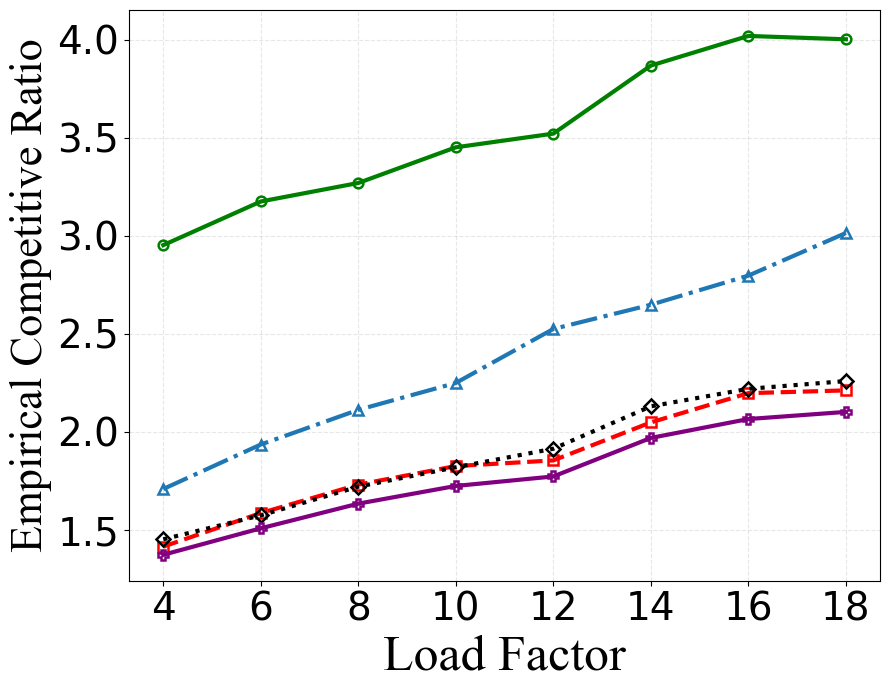

In [20]:
import pandas as pd
import os
import matplotlib.pyplot as plt
value_mode="stationwise"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"

plot_df, fcfs_avg, myalg_avg, theory_avg = build_avg_cr_vs_loadfactor_tables(
    offline_csv=offline_csv,
    fcfs_csv=fcfs_csv,
    myalg_csv=myalg_csv,
    best_myalg_csv=best_myalg_csv,
    theory_myalg_csv=theory_myalg_csv,
)

ml_pred_avg = build_ml_predicted_cr_table(
    ml_csv=ml_predicted_csv,
    offline_csv=offline_csv,
)

testlabel_avg = build_testlabel_cr_table(
    testlabel_csv=testlabel_csv,
    offline_csv=offline_csv,
)

plot_df = pd.concat([plot_df, ml_pred_avg, testlabel_avg], ignore_index=True)

display(plot_df)

plot_avg_cr_vs_loadfactor(
    plot_df,
    save_path=f"results/avg_cr_vs_loadfactor_all_algs_{value_mode}_v2.pdf",
)

## Build per-instance CR table for one chosen capacity / load factor

In [22]:
def build_instance_cr_cdf_table(
    offline_csv,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv,
    ml_csv=None,
    testlabel_csv=None,
    target_total_capacity=None,
    target_load_factor=None,
    tol=1e-8,
):
    def _round_float_cols(df, cols):
        df = df.copy()
        for col in cols:
            df[col] = df[col].astype(float).round(10)
        return df

    def _filter_one_setting(
        df, target_total_capacity=None, target_load_factor=None, tol=1e-8
    ):
        out = df.copy()

        if target_total_capacity is not None:
            out = out[
                np.isclose(
                    out["total_capacity"].astype(float),
                    float(target_total_capacity),
                    atol=tol,
                )
            ].copy()

        if target_load_factor is not None:
            out = out[
                np.isclose(
                    out["load_factor"].astype(float),
                    float(target_load_factor),
                    atol=tol,
                )
            ].copy()

        return out.reset_index(drop=True)

    # -------------------------
    # Read CSVs
    # -------------------------
    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    # opa_df = pd.read_csv(opa_csv)
    myalg_df = pd.read_csv(myalg_csv)
    best_df = pd.read_csv(best_myalg_csv)
    theory_df = pd.read_csv(theory_myalg_csv)
    # -------------------------
    # Keep needed columns
    # -------------------------
    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_utility",
        ]
    ].copy()

    fcfs_df = fcfs_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "fcfs_utility",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_utility",
        ]
    ].copy()

    best_df = best_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ]
    ].copy()

    theory_df = theory_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "theory_myalg_utility",
        ]
    ].copy()

    offline_df = _round_float_cols(
        offline_df, ["total_capacity", "per_station_capacity", "load_factor"]
    )
    fcfs_df = _round_float_cols(
        fcfs_df, ["total_capacity", "per_station_capacity", "load_factor"]
    )

    myalg_df = _round_float_cols(
        myalg_df,
        ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
    )
    best_df = _round_float_cols(
        best_df,
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
    )
    theory_df = _round_float_cols(
        theory_df,
        ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"],
    )

    # -------------------------
    # Filter to one chosen setting
    # -------------------------
    offline_df = _filter_one_setting(
        offline_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    fcfs_df = _filter_one_setting(
        fcfs_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    myalg_df = _filter_one_setting(
        myalg_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    best_df = _filter_one_setting(
        best_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )
    theory_df = _filter_one_setting(
        theory_df,
        target_total_capacity=target_total_capacity,
        target_load_factor=target_load_factor,
        tol=tol,
    )

    # -------------------------
    # FCFS CR rows
    # -------------------------
    fcfs_merge = fcfs_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    fcfs_merge["competitive_ratio"] = fcfs_merge.apply(
        lambda r: safe_ratio(r["offline_utility"], r["fcfs_utility"]),
        axis=1,
    )

    fcfs_rows = fcfs_merge[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    fcfs_rows["algorithm"] = "FCFS"
    # -------------------------
    # Theory-MyAlg CR rows
    # -------------------------
    theory_merge = theory_df.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    theory_merge["competitive_ratio"] = theory_merge.apply(
        lambda r: safe_ratio(r["offline_utility"], r["theory_myalg_utility"]),
        axis=1,
    )

    theory_rows = theory_merge[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    theory_rows["algorithm"] = "Theory-MyAlg"
    # -------------------------
    # MyAlg(best beta, eta) CR rows
    # -------------------------
    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(
        offline_df,
        on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
        how="inner",
    )

    myalg_best["competitive_ratio"] = myalg_best.apply(
        lambda r: safe_ratio(r["offline_utility"], r["myalg_utility"]),
        axis=1,
    )

    myalg_rows = myalg_best[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "competitive_ratio",
        ]
    ].copy()
    myalg_rows["algorithm"] = "MyAlg"

    out_parts = [fcfs_rows, theory_rows, myalg_rows]
    # -------------------------
    # Optional ML_MyAlg CR rows
    # -------------------------
    if ml_csv is not None and os.path.exists(ml_csv):
        ml_df = pd.read_csv(ml_csv)

        ml_df = ml_df[
            [
                "replicate_id",
                "instance_id",
                "total_capacity",
                "load_factor",
                "predicted_param_utility",
            ]
        ].copy()

        ml_df = _round_float_cols(ml_df, ["total_capacity", "load_factor"])

        ml_df = _filter_one_setting(
            ml_df,
            target_total_capacity=target_total_capacity,
            target_load_factor=target_load_factor,
            tol=tol,
        )

        offline_ml = offline_df[
            ["instance_id", "total_capacity", "load_factor", "offline_utility"]
        ].copy()

        ml_merge = ml_df.merge(
            offline_ml,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        ml_merge["competitive_ratio"] = ml_merge.apply(
            lambda r: safe_ratio(r["offline_utility"], r["predicted_param_utility"]),
            axis=1,
        )

        ml_rows = ml_merge[
            ["total_capacity", "load_factor", "instance_id", "competitive_ratio"]
        ].copy()
        ml_rows["per_station_capacity"] = np.nan
        ml_rows["algorithm"] = "ML_MyAlg"

        out_parts.append(ml_rows)
    # -------------------------
    # Optional TestLabel_MyAlg CR rows   
    # -------------------------
    if testlabel_csv is not None and os.path.exists(testlabel_csv):
        testlabel_df = pd.read_csv(testlabel_csv)

        testlabel_df = testlabel_df[
            [
                "replicate_id",
                "instance_id",
                "total_capacity",
                "load_factor",
                "testlabel_utility",
            ]
        ].copy()

        testlabel_df = _round_float_cols(testlabel_df, ["total_capacity", "load_factor"])

        testlabel_df = _filter_one_setting(
            testlabel_df,
            target_total_capacity=target_total_capacity,
            target_load_factor=target_load_factor,
            tol=tol,
        )

        offline_testlabel = offline_df[
            ["instance_id", "total_capacity", "load_factor", "offline_utility"]
        ].copy()

        testlabel_merge = testlabel_df.merge(
            offline_testlabel,
            on=["instance_id", "total_capacity", "load_factor"],
            how="inner",
        )

        testlabel_merge["competitive_ratio"] = testlabel_merge.apply(
            lambda r: safe_ratio(r["offline_utility"], r["testlabel_utility"]),
            axis=1,
        )

        testlabel_rows = testlabel_merge[
            ["total_capacity", "load_factor", "instance_id", "competitive_ratio"]
        ].copy()
        testlabel_rows["per_station_capacity"] = np.nan
        testlabel_rows["algorithm"] = "TestLabel_MyAlg"

        out_parts.append(testlabel_rows)

    cdf_df = pd.concat(out_parts, ignore_index=True)
    cdf_df = cdf_df.dropna(subset=["competitive_ratio"]).copy()
    cdf_df = cdf_df.sort_values(
        ["algorithm", "competitive_ratio", "instance_id"]
    ).reset_index(drop=True)

    return cdf_df

## Plot CDF of competitive ratio for one chosen capacity / load factor


In [24]:
def plot_cr_cdf_for_one_setting(
    cdf_df,
    target_total_capacity=None,
    target_load_factor=None,
    save_path=None,
):
    cdf_df = cdf_df.copy()

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "OPS*",
        "Theory-MyAlg": "OPS",
        "ML_MyAlg": "D-OPS",
        "TestLabel_MyAlg": "D-OPS*",
    }
    cdf_df["algorithm"] = cdf_df["algorithm"].replace(name_map)

    plt.figure(figsize=(9, 7))

    alg_order = ["FCFS", "OPS", "OPS*", "D-OPS", "D-OPS*"]

    style_map = {
        "FCFS": {"marker": "o", "linestyle": "-", "linewidth": 3, "color": "green"},
        "OPS": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 3,
            "color": "#1f77b4",
        },
        "OPS*": {"marker": "s", "linestyle": "--", "linewidth": 3, "color": "red"},
        "D-OPS": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 3,
            "color": "black",
        },
        "D-OPS*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 3,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = cdf_df[cdf_df["algorithm"] == alg_name].copy()

        if sub.empty:
            continue

        cr_vals = sub["competitive_ratio"].to_numpy(dtype=float)
        cr_vals = np.maximum(cr_vals, 1.0)
        x = np.sort(cr_vals)
        y = np.arange(1, len(x) + 1) / float(len(x))

        plt.plot(
            x,
            y,
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=4,
            markerfacecolor="none",
            markeredgewidth=2.0,
            color=style_map[alg_name]["color"],
            markevery=max(len(x) // 15, 1),
        )

    plt.xlabel("Empirical Competitive Ratio", fontsize=36, fontname="Times New Roman")
    plt.ylabel("CDF", fontsize=32, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)
    # plt.legend(fontsize=20, frameon=True, loc="lower right")
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

## CDF of competitive ratio for one chosen capacity / load factor


,total_capacity,per_station_capacity,load_factor,instance_id,competitive_ratio,algorithm
1,4.780255,1.593418,8.0,17,2.478989,FCFS
2,4.780255,1.593418,8.0,7,2.508315,FCFS
3,4.780255,1.593418,8.0,34,2.555403,FCFS
4,4.780255,1.593418,8.0,84,2.569481,FCFS
5,4.780255,1.593418,8.0,76,2.665200,FCFS


,algorithm,p80,p90,p99
0,FCFS,3.617449,3.844375,4.357570
1,D-OPS,1.789782,1.823929,1.914024


Saved plot to: results/cdf_cr_one_setting_stationwise_v2.pdf


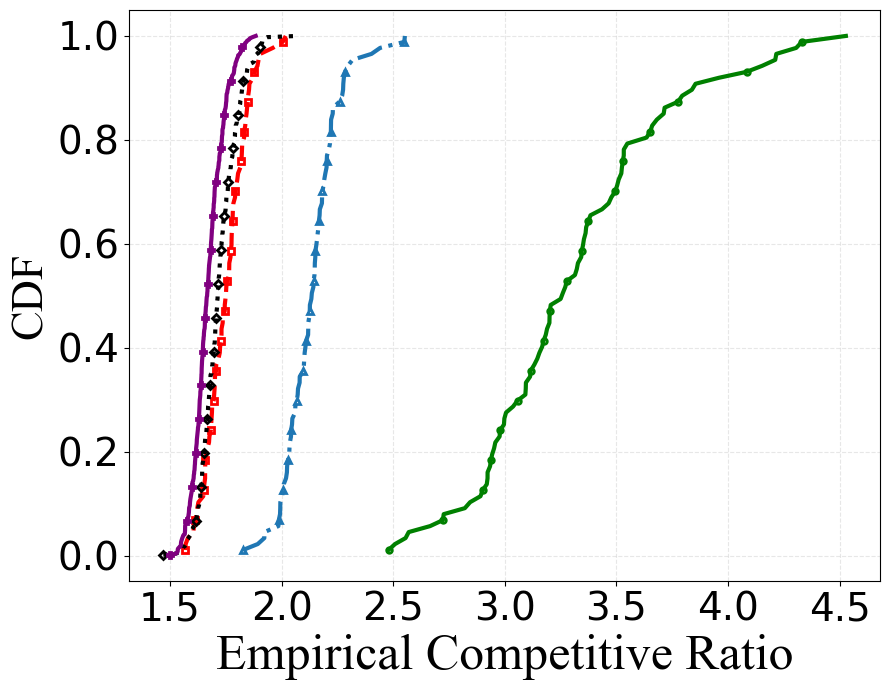

In [25]:
value_mode="stationwise"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = (
    f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
)
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = (
    f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"
)

ml_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test_half_{value_mode}_by_loadfactor.csv"
testlabel_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/testlabel_myalg_test_half_{value_mode}_by_loadfactor.csv"

# choose one setting
target_total_capacity = None
target_load_factor = 8

cdf_df = build_instance_cr_cdf_table(
    offline_csv=offline_csv,
    fcfs_csv=fcfs_csv,
    myalg_csv=myalg_csv,
    best_myalg_csv=best_myalg_csv,
    theory_myalg_csv=theory_myalg_csv,
    ml_csv=ml_csv,
    testlabel_csv=testlabel_csv,
    target_total_capacity=target_total_capacity,
    target_load_factor=target_load_factor,
    tol=0.01,
)
cdf_df = cdf_df[cdf_df["competitive_ratio"] > 1].copy()

display(cdf_df.head())
name_map = {
    "FCFS": "FCFS",
    "MyAlg": "OPS*",
    "Theory-MyAlg": "OPS",
    "ML_MyAlg": "D-OPS",
    "TestLabel_MyAlg": "D-OPS*",
}

cdf_df["algorithm"] = cdf_df["algorithm"].replace(name_map)
# Compute 80th, 90th, and 99th percentiles for FCFS and SMSP*
percentiles = [0.80, 0.90, 0.99]
algorithms = ["FCFS", "D-OPS"]

results = []

for alg in algorithms:
    sub = cdf_df[cdf_df["algorithm"] == alg].copy()
    cr_vals = sub["competitive_ratio"].dropna().astype(float)

    if len(cr_vals) == 0:
        continue

    q = cr_vals.quantile(percentiles)

    results.append({
        "algorithm": alg,
        "p80": q.loc[0.80],
        "p90": q.loc[0.90],
        "p99": q.loc[0.99],
    })

percentile_df = pd.DataFrame(results)
display(percentile_df)

plot_cr_cdf_for_one_setting(
    cdf_df=cdf_df,
    target_total_capacity=target_total_capacity,
    target_load_factor=target_load_factor,
    save_path=f"results/cdf_cr_one_setting_{value_mode}_v2.pdf",
)

## Cal Avg CR for OPS and FCFS

In [6]:
import pandas as pd
import numpy as np

def safe_ratio(offline_u, alg_u, eps=1e-12):
    if pd.isna(offline_u) or pd.isna(alg_u):
        return np.nan
    return float(offline_u) / max(float(alg_u), eps)


value_mode = "stationwise"   # or "fixed"

offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
theory_csv = f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"

# Load
offline_df = pd.read_csv(offline_csv)
fcfs_df = pd.read_csv(fcfs_csv)
ops_df = pd.read_csv(theory_csv)

# Round for safe merge
for df in [offline_df, fcfs_df, ops_df]:
    for col in ["total_capacity", "per_station_capacity", "load_factor"]:
        df[col] = df[col].astype(float).round(10)

# Filter ONLY load factor = 8
target_lf = 8
tol = 1e-2

offline_df = offline_df[np.isclose(offline_df["load_factor"], target_lf, atol=tol)]
fcfs_df = fcfs_df[np.isclose(fcfs_df["load_factor"], target_lf, atol=tol)]
ops_df = ops_df[np.isclose(ops_df["load_factor"], target_lf, atol=tol)]

# ---------------- FCFS ----------------
fcfs_merge = fcfs_df.merge(
    offline_df,
    on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
    how="inner",
)

fcfs_merge["profit_ratio"] = fcfs_merge.apply(
    lambda r: safe_ratio(r["offline_utility"], r["fcfs_utility"]),
    axis=1,
)

fcfs_avg = fcfs_merge["profit_ratio"].mean()

# ---------------- OPS ----------------
ops_merge = ops_df.merge(
    offline_df,
    on=["total_capacity", "per_station_capacity", "load_factor", "instance_id"],
    how="inner",
)

ops_merge["profit_ratio"] = ops_merge.apply(
    lambda r: safe_ratio(r["offline_utility"], r["theory_myalg_utility"]),
    axis=1,
)

ops_avg = ops_merge["profit_ratio"].mean()

print("Load factor = 8")
print("FCFS avg profit ratio:", fcfs_avg)
print("OPS avg profit ratio :", ops_avg)

Load factor = 8
FCFS avg profit ratio: 3.2698455594089295
OPS avg profit ratio : 2.1128723349892304


## Cal Cr of OPS Improvement vs FCFS

In [33]:
import pandas as pd
import numpy as np
import os

def safe_ratio(num, den, eps=1e-12):
    if pd.isna(num) or pd.isna(den):
        return np.nan
    if float(den) <= eps:
        return np.nan
    return float(num) / float(den)


def compute_max_ops_improvement_across_ul(
    value_mode="stationwise",
    results_dir="results_ul_sweep_one_capacity",
    L_value=1,
    U_list=[6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30],
):
    summary_csv = os.path.join(
        results_dir,
        f"cr_vs_u_over_l_one_capacity_summary_{value_mode}.csv"
    )

    if not os.path.exists(summary_csv):
        raise FileNotFoundError(f"Missing summary CSV: {summary_csv}")

    summary_df = pd.read_csv(summary_csv)

    print("Loaded summary file:")
    print(summary_csv)
    display(summary_df.head())

    # If the summary already contains fcfs_avg_cr and ops_avg_cr, use it directly
    required_cols = ["U_over_L", "fcfs_avg_cr", "ops_avg_cr"]
    if all(col in summary_df.columns for col in required_cols):
        result = summary_df[required_cols].copy()
        result["ops_improvement_pct"] = (
            (result["fcfs_avg_cr"] - result["ops_avg_cr"])
            / result["fcfs_avg_cr"]
            * 100
        )
        result = result.sort_values("U_over_L").reset_index(drop=True)

        max_row = result.loc[result["ops_improvement_pct"].idxmax()]

        print("\nImprovement of OPS compared to FCFS across all U/L values:")
        display(result)

        print("\n=== Maximum improvement across all U/Ls ===")
        print(f"U/L = {max_row['U_over_L']}")
        print(f"FCFS avg profit ratio = {max_row['fcfs_avg_cr']:.4f}")
        print(f"OPS avg profit ratio  = {max_row['ops_avg_cr']:.4f}")
        print(f"Max improvement (%)   = {max_row['ops_improvement_pct']:.2f}")

        return result, max_row

    # Otherwise compute using per-U offline files
    rows = []

    for U in U_list:
        offline_csv = os.path.join(
            results_dir,
            f"offline_U{U}_L{L_value}_{value_mode}.csv"
        )

        if not os.path.exists(offline_csv):
            raise FileNotFoundError(f"Missing offline CSV: {offline_csv}")

        print("Found:", offline_csv)

    raise ValueError(
        "The summary file does not contain fcfs_avg_cr and ops_avg_cr. "
        "If needed, send me the baseline notebook summary format and I’ll adapt the code."
    )


# Run
ul_result_df, ul_max_row = compute_max_ops_improvement_across_ul(
    value_mode="stationwise",
    results_dir="results_ul_sweep_one_capacity",
    L_value=1,
    U_list=[6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30],
)

Loaded summary file:
results_ul_sweep_one_capacity/cr_vs_u_over_l_one_capacity_summary_stationwise.csv


,U,L,U_over_L,target_total_capacity,per_station_capacity,time_window,avg_demand,load_factor,theta,D,theory_beta_raw,theory_beta_used,theory_eta,theory_objective,best_beta,best_eta,fcfs_avg_cr,ops_avg_cr,ops_star_avg_cr
0,6.0,1.0,6.0,4.78,1.593333,97.0,3709.477523,8.000426,6.0,16,406.924599,67.820767,0.217856,7.317642,3.2,2.7,2.673975,2.098372,1.671926
1,8.0,1.0,8.0,4.78,1.593333,97.0,3709.477523,8.000426,8.0,16,616.964240,102.827373,0.196402,7.686659,3.6,2.9,2.857263,2.093726,1.688151
2,10.0,1.0,10.0,4.78,1.593333,97.0,3709.477523,8.000426,10.0,16,843.665601,140.610933,0.182025,7.964194,4.2,2.9,2.981093,2.102926,1.696771
3,12.0,1.0,12.0,4.78,1.593333,97.0,3709.477523,8.000426,12.0,16,1071.401079,178.566847,0.173428,8.186682,5.6,2.5,3.070383,2.107728,1.707330
4,14.0,1.0,14.0,4.78,1.593333,97.0,3709.477523,8.000426,14.0,16,1301.093430,216.848905,0.167538,8.372365,5.6,2.9,3.137824,2.110639,1.710571



Improvement of OPS compared to FCFS across all U/L values:


,U_over_L,fcfs_avg_cr,ops_avg_cr,ops_improvement_pct
0,6.0,2.673975,2.098372,21.526114
1,8.0,2.857263,2.093726,26.722666
2,10.0,2.981093,2.102926,29.457883
3,12.0,3.070383,2.107728,31.352920
4,14.0,3.137824,2.110639,32.735601
5,16.0,3.190568,2.108791,33.905476
6,18.0,3.232947,2.107726,34.804818
7,20.0,3.267747,2.112717,35.346356
8,22.0,3.296834,2.111139,35.964658
9,24.0,3.321509,2.113687,36.363655



=== Maximum improvement across all U/Ls ===
U/L = 30.0
FCFS avg profit ratio = 3.3772
OPS avg profit ratio  = 2.1008
Max improvement (%)   = 37.79


## Cal Cr of D-OPS Improvement vs FCFS

In [34]:
import pandas as pd
import os

value_mode = "stationwise"

# Baseline summary from the U/L baseline notebook
summary_csv = os.path.join(
    "results_ul_sweep_one_capacity",
    f"cr_vs_u_over_l_one_capacity_summary_{value_mode}.csv"
)

# D-OPS results from the ML-only U/L notebook
ml_summary_csv = os.path.join(
    f"ul_sweep_ml_only_{value_mode}",
    f"ml_only_avg_cr_vs_u_over_l_{value_mode}.csv"
)

baseline_df = pd.read_csv(summary_csv)
ml_df = pd.read_csv(ml_summary_csv)

# Keep only FCFS from baseline
fcfs_df = baseline_df[["U_over_L", "fcfs_avg_cr"]].copy()

# Keep only D-OPS from ML summary
dops_df = ml_df[ml_df["algorithm"] == "D-OPS"][["U_over_L", "avg_cr_over_loads"]].copy()
dops_df = dops_df.rename(columns={"avg_cr_over_loads": "dops_avg_cr"})

# Merge
result = fcfs_df.merge(dops_df, on="U_over_L", how="inner")

# Improvement of D-OPS over FCFS
result["dops_improvement_pct"] = (
    (result["fcfs_avg_cr"] - result["dops_avg_cr"])
    / result["fcfs_avg_cr"]
    * 100
)

# Maximum improvement across all U/Ls
max_row = result.loc[result["dops_improvement_pct"].idxmax()]

display(result)

print("Maximum improvement of D-OPS compared to FCFS across all U/Ls:")
print(f"U/L = {max_row['U_over_L']}")
print(f"FCFS avg profit ratio = {max_row['fcfs_avg_cr']:.4f}")
print(f"D-OPS avg profit ratio = {max_row['dops_avg_cr']:.4f}")
print(f"Max improvement (%) = {max_row['dops_improvement_pct']:.2f}")

,U_over_L,fcfs_avg_cr,dops_avg_cr,dops_improvement_pct
0,6.0,2.673975,1.934799,27.643328
1,8.0,2.857263,1.818994,36.337880
2,10.0,2.981093,1.774322,40.480805
3,12.0,3.070383,1.752349,42.927340
4,14.0,3.137824,1.741889,44.487377
5,16.0,3.190568,1.728575,45.822338
6,18.0,3.232947,1.722032,46.734917
7,20.0,3.267747,1.721127,47.329863
8,22.0,3.296834,1.720428,47.815745
9,24.0,3.321509,1.724329,48.085968


Maximum improvement of D-OPS compared to FCFS across all U/Ls:
U/L = 30.0
FCFS avg profit ratio = 3.3772
D-OPS avg profit ratio = 1.7315
Max improvement (%) = 48.73


## Avg Acceptance Rate

In [128]:
## Build average acceptance-rate tables for all algorithms

def get_instance_size_df(dataloader):
    rows = []
    for instance_id, instance in enumerate(dataloader):
        rows.append(
            {
                "instance_id": int(instance_id),
                "total_evs": int(len(instance)),
            }
        )
    return pd.DataFrame(rows)


def build_avg_acceptance_vs_loadfactor_tables(
    dataloader,
    offline_csv,
    fcfs_csv,
    myalg_csv,
    best_myalg_csv,
    theory_myalg_csv=None,
    ml_csv=None,
    testlabel_csv=None,
):
    instance_size_df = get_instance_size_df(dataloader)

    offline_df = pd.read_csv(offline_csv)
    fcfs_df = pd.read_csv(fcfs_csv)
    myalg_df = pd.read_csv(myalg_csv)
    best_df = pd.read_csv(best_myalg_csv)

    theory_df = None
    if theory_myalg_csv is not None and os.path.exists(theory_myalg_csv):
        theory_df = pd.read_csv(theory_myalg_csv)

    ml_df = None
    if ml_csv is not None and os.path.exists(ml_csv):
        ml_df = pd.read_csv(ml_csv)

    testlabel_df = None
    if testlabel_csv is not None and os.path.exists(testlabel_csv):
        testlabel_df = pd.read_csv(testlabel_csv)

    # -------------------------
    # Keep needed columns
    # -------------------------
    offline_df = offline_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "offline_admitted_evs",
        ]
    ].copy()

    fcfs_df = fcfs_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "fcfs_admitted_evs",
        ]
    ].copy()

    myalg_df = myalg_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "instance_id",
            "beta",
            "eta",
            "myalg_admitted_evs",
        ]
    ].copy()

    best_df = best_df[
        [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ]
    ].copy()

    if theory_df is not None:
        theory_df = theory_df[
            [
                "total_capacity",
                "per_station_capacity",
                "load_factor",
                "instance_id",
                "beta",
                "eta",
                "theory_myalg_admitted_evs",
            ]
        ].copy()

    # -------------------------
    # Round float columns
    # -------------------------
    for df in [offline_df, fcfs_df]:
        for col in ["total_capacity", "per_station_capacity", "load_factor"]:
            df[col] = df[col].astype(float).round(10)

    for col in ["total_capacity", "per_station_capacity", "load_factor", "beta", "eta"]:
        myalg_df[col] = myalg_df[col].astype(float).round(10)

    for col in [
        "total_capacity",
        "per_station_capacity",
        "load_factor",
        "best_beta",
        "best_eta",
    ]:
        best_df[col] = best_df[col].astype(float).round(10)

    if theory_df is not None:
        for col in [
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ]:
            theory_df[col] = theory_df[col].astype(float).round(10)

    # -------------------------
    # FCFS acceptance
    # -------------------------
    fcfs_merge = fcfs_df.merge(instance_size_df, on="instance_id", how="left")
    fcfs_merge["acceptance_rate"] = (
        fcfs_merge["fcfs_admitted_evs"] / fcfs_merge["total_evs"]
    )

    fcfs_avg = (
        fcfs_merge.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    fcfs_avg["algorithm"] = "FCFS"

    # -------------------------
    # Offline acceptance
    # -------------------------
    offline_merge = offline_df.merge(instance_size_df, on="instance_id", how="left")
    offline_merge["acceptance_rate"] = (
        offline_merge["offline_admitted_evs"] / offline_merge["total_evs"]
    )

    offline_avg = (
        offline_merge.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    offline_avg["algorithm"] = "Offline"

    # -------------------------
    # MyAlg best beta/eta acceptance
    # -------------------------
    myalg_best = myalg_df.merge(
        best_df,
        left_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "beta",
            "eta",
        ],
        right_on=[
            "total_capacity",
            "per_station_capacity",
            "load_factor",
            "best_beta",
            "best_eta",
        ],
        how="inner",
    )

    myalg_best = myalg_best.merge(instance_size_df, on="instance_id", how="left")
    myalg_best["acceptance_rate"] = (
        myalg_best["myalg_admitted_evs"] / myalg_best["total_evs"]
    )

    myalg_avg = (
        myalg_best.groupby(
            ["total_capacity", "per_station_capacity", "load_factor"],
            as_index=False,
        )
        .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
        .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
        .reset_index(drop=True)
    )
    myalg_avg["algorithm"] = "MyAlg"

    # -------------------------
    # Theory-MyAlg acceptance
    # -------------------------
    theory_avg = pd.DataFrame()
    if theory_df is not None:
        theory_merge = theory_df.merge(instance_size_df, on="instance_id", how="left")
        theory_merge["acceptance_rate"] = (
            theory_merge["theory_myalg_admitted_evs"] / theory_merge["total_evs"]
        )

        theory_avg = (
            theory_merge.groupby(
                ["total_capacity", "per_station_capacity", "load_factor"],
                as_index=False,
            )
            .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
            .sort_values(["total_capacity", "per_station_capacity", "load_factor"])
            .reset_index(drop=True)
        )
        theory_avg["algorithm"] = "Theory-MyAlg"

    # -------------------------
    # Optional ML acceptance
    # Only included if admitted-count column exists
    # -------------------------
    ml_avg = pd.DataFrame()
    if ml_df is not None:
        candidate_cols = [
            "predicted_param_admitted_evs",
            "ml_admitted_evs",
            "admitted_evs",
        ]
        admitted_col = next((c for c in candidate_cols if c in ml_df.columns), None)

        if admitted_col is not None:
            ml_df = ml_df[
                [
                    "replicate_id",
                    "instance_id",
                    "total_capacity",
                    "load_factor",
                    admitted_col,
                ]
            ].copy()

            for col in ["total_capacity", "load_factor"]:
                ml_df[col] = ml_df[col].astype(float).round(10)

            ml_df = ml_df.merge(instance_size_df, on="instance_id", how="left")
            ml_df["acceptance_rate"] = ml_df[admitted_col] / ml_df["total_evs"]

            ml_avg = (
                ml_df.groupby(["total_capacity", "load_factor"], as_index=False)
                .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
                .sort_values(["total_capacity", "load_factor"])
                .reset_index(drop=True)
            )
            ml_avg["per_station_capacity"] = np.nan
            ml_avg["algorithm"] = "ML_MyAlg"

    # -------------------------
    # Optional TestLabel acceptance
    # Only included if admitted-count column exists
    # -------------------------
    testlabel_avg = pd.DataFrame()
    if testlabel_df is not None:
        candidate_cols = [
            "testlabel_admitted_evs",
            "admitted_evs",
        ]
        admitted_col = next((c for c in candidate_cols if c in testlabel_df.columns), None)

        if admitted_col is not None:
            testlabel_df = testlabel_df[
                [
                    "replicate_id",
                    "instance_id",
                    "total_capacity",
                    "load_factor",
                    admitted_col,
                ]
            ].copy()

            for col in ["total_capacity", "load_factor"]:
                testlabel_df[col] = testlabel_df[col].astype(float).round(10)

            testlabel_df = testlabel_df.merge(instance_size_df, on="instance_id", how="left")
            testlabel_df["acceptance_rate"] = (
                testlabel_df[admitted_col] / testlabel_df["total_evs"]
            )

            testlabel_avg = (
                testlabel_df.groupby(["total_capacity", "load_factor"], as_index=False)
                .agg(avg_acceptance_rate=("acceptance_rate", "mean"))
                .sort_values(["total_capacity", "load_factor"])
                .reset_index(drop=True)
            )
            testlabel_avg["per_station_capacity"] = np.nan
            testlabel_avg["algorithm"] = "TestLabel_MyAlg"

    # -------------------------
    # Combine
    # -------------------------
    plot_parts = [offline_avg, fcfs_avg, myalg_avg]

    if not theory_avg.empty:
        plot_parts.append(theory_avg)
    if not ml_avg.empty:
        plot_parts.append(ml_avg)
    if not testlabel_avg.empty:
        plot_parts.append(testlabel_avg)

    plot_df = pd.concat(plot_parts, ignore_index=True)
    plot_df = plot_df.sort_values(
        ["algorithm", "total_capacity", "per_station_capacity", "load_factor"]
    ).reset_index(drop=True)

    return plot_df, offline_avg, fcfs_avg, myalg_avg, theory_avg, ml_avg, testlabel_avg

In [131]:
def plot_avg_acceptance_vs_loadfactor(plot_df, save_path=None):
    plot_df = plot_df.copy()
    plot_df["load_factor"] = plot_df["load_factor"].astype(float).round(10)

    name_map = {
        "FCFS": "FCFS",
        "MyAlg": "SMSP*",
        "Theory-MyAlg": "SMSP",
        "ML_MyAlg": "Predictive-SMSP",
        "TestLabel_MyAlg": "Oracle-Test-SMSP*",
    }
    plot_df["algorithm"] = plot_df["algorithm"].replace(name_map)

    plot_df = plot_df[plot_df["algorithm"] != "Offline"].copy()

    plot_ready = plot_df.sort_values(["algorithm", "load_factor"]).reset_index(drop=True)

    plt.figure(figsize=(9, 5.5))

    alg_order = ["FCFS", "SMSP", "SMSP*", "Predictive-SMSP", "Oracle-Test-SMSP*"]

    style_map = {
        "FCFS": {
            "marker": "o",
            "linestyle": "-",
            "linewidth": 2,
            "color": "green",
        },
        "SMSP": {
            "marker": "^",
            "linestyle": "-.",
            "linewidth": 2,
            "color": "#1f77b4",
        },
        "SMSP*": {
            "marker": "s",
            "linestyle": "--",
            "linewidth": 2,
            "color": "red",
        },
        "Predictive-SMSP": {
            "marker": "D",
            "linestyle": ":",
            "linewidth": 2.2,
            "color": "black",
        },
        "Oracle-Test-SMSP*": {
            "marker": "P",
            "linestyle": "-",
            "linewidth": 2,
            "color": "purple",
        },
    }

    for alg_name in alg_order:
        sub = plot_ready[plot_ready["algorithm"] == alg_name]
        if sub.empty:
            continue

        plt.plot(
            sub["load_factor"],
            sub["avg_acceptance_rate"],
            label=alg_name,
            marker=style_map[alg_name]["marker"],
            linestyle=style_map[alg_name]["linestyle"],
            linewidth=style_map[alg_name]["linewidth"],
            markersize=7,
            markerfacecolor="none",
            markeredgewidth=1.8,
            color=style_map[alg_name]["color"],
        )

    plt.xlabel("Load Factor", fontsize=30, fontname="Times New Roman")
    plt.ylabel("Acceptance Rate", fontsize=30, fontname="Times New Roman")
    plt.grid(True, alpha=0.3, linestyle="--")
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    # plt.ylim(0, 1.05)
    plt.ylim(0, 0.4)
    plt.legend(fontsize=15, frameon=True, loc="best")
    plt.tight_layout()

    if save_path is not None:
        out_dir = os.path.dirname(save_path)
        if out_dir:
            os.makedirs(out_dir, exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved plot to:", save_path)

    plt.show()

,total_capacity,per_station_capacity,load_factor,avg_acceptance_rate,algorithm
0,2.124558,0.708186,18.0,0.050474,FCFS
1,2.390127,0.796709,16.0,0.055572,FCFS
2,2.731574,0.910525,14.0,0.066969,FCFS
3,3.186836,1.062279,12.0,0.078466,FCFS
4,3.824204,1.274735,10.0,0.091346,FCFS
5,4.780255,1.593418,8.0,0.116465,FCFS
6,6.373673,2.124558,6.0,0.152571,FCFS
7,9.560509,3.186836,4.0,0.230028,FCFS
8,2.124558,NaN,18.0,0.050577,ML_MyAlg
9,2.390127,NaN,16.0,0.060551,ML_MyAlg


Saved plot to: results/avg_acceptance_vs_loadfactor_all_algs_fixed.pdf


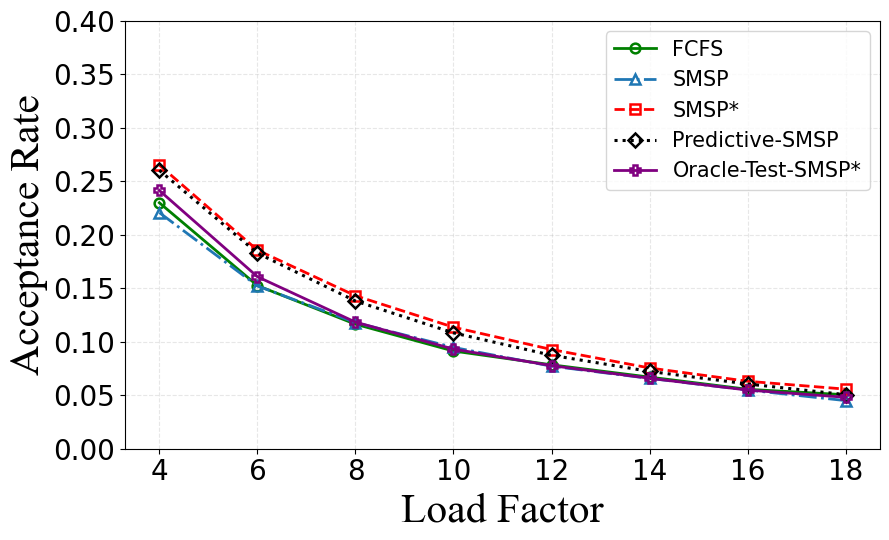

In [133]:
value_mode = "fixed"
offline_csv = f"results/offline_instance_results_{value_mode}_by_loadfactor.csv"
fcfs_csv = f"results/fcfs_instance_results_{value_mode}_by_loadfactor.csv"
myalg_csv = f"results/myalg_beta_eta_grid_instance_results_{value_mode}_by_loadfactor.csv"
best_myalg_csv = f"results/best_beta_eta_{value_mode}_by_loadfactor.csv"
theory_myalg_csv = f"results/theory_myalg_instance_results_{value_mode}_by_loadfactor.csv"

ml_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/predicted_param_myalg_test_half_{value_mode}_by_loadfactor.csv"
testlabel_csv = f"pfinalized/train_test_half_split_scalar_ml_random_pairs_{value_mode}/testlabel_myalg_test_half_{value_mode}_by_loadfactor.csv"

accept_plot_df, offline_acc, fcfs_acc, myalg_acc, theory_acc, ml_acc, testlabel_acc = (
    build_avg_acceptance_vs_loadfactor_tables(
        dataloader=dataloader,
        offline_csv=offline_csv,
        fcfs_csv=fcfs_csv,
        myalg_csv=myalg_csv,
        best_myalg_csv=best_myalg_csv,
        theory_myalg_csv=theory_myalg_csv,
        ml_csv=ml_csv,
        testlabel_csv=testlabel_csv,
    )
)

display(accept_plot_df)

plot_avg_acceptance_vs_loadfactor(
    accept_plot_df,
    save_path=f"results/avg_acceptance_vs_loadfactor_all_algs_{value_mode}.pdf",
)